**Data Description:**

The dataset is from the Aspiring Mind Employment Outcome 2015 (AMEO) released by Aspiring Minds. It primarily focuses on students with engineering disciplines and contains information about their employment outcomes. Here are the key features of the dataset:

1. **ID:** Unique identifier for each candidate.
2. **Salary:** Annual CTC (Cost to Company) offered to the candidate (in INR).
3. **DOJ (Date of Joining):** Date when the candidate joined the company.
4. **DOL (Date of Leaving):** Date when the candidate left the company.
5. **Designation:** Job title offered to the candidate.
6. **JobCity:** Location of the job (city).
7. **Gender:** Candidate's gender.
8. **DOB (Date of Birth):** Date of birth of the candidate.
9. **10percentage:** Overall marks obtained in grade 10 examinations.
10. **10board:** The school board followed by the candidate in grade 10.
11. **12graduation:** Year of graduation from senior year high school.
12. **12percentage:** Overall marks obtained in grade 12 examinations.
13. **12board:** The school board followed by the candidate in grade 12.
14. **CollegeID:** Unique ID identifying the college attended by the candidate.
15. **CollegeTier:** Tier of the college.
16. **Degree:** Degree obtained or pursued by the candidate.
17. **Specialization:** Specialization pursued by the candidate.
18. **CollegeGPA:** Aggregate GPA at graduation.
19. **CollegeCityID:** Unique ID identifying the city where the college is located.
20. **CollegeCityTier:** Tier of the city where the college is located.
21. **CollegeState:** Name of the state where the college is located.
22. **GraduationYear:** Year of graduation (Bachelor's degree).
23. **English, Logical, Quant:** Scores in AMCAT sections.
24. **Domain:** Scores in AMCAT's domain module.
25. **ComputerProgramming, ElectronicsAndSemicon, ComputerScience, MechanicalEngg, ElectricalEngg, TelecomEngg, CivilEngg:** Scores in AMCAT's sections related to engineering disciplines.
26. **Conscientiousness, Agreeableness, Extraversion, Neuroticism, Openness_to_experience:** Scores in AMCAT's personality test sections.

**Objective:**

The objective of the analysis is two-fold:

1. **Test the Claim:** To validate the claim made in the Times of India article dated Jan 18, 2019, which states that fresh graduates with Computer Science Engineering backgrounds, taking up jobs as Programming Analysts, Software Engineers, Hardware Engineers, and Associate Engineers, can earn up to 2.5-3 lakhs.
2. **Explore Gender-Specialization Relationship:** To determine if there is a relationship between gender and specialization, i.e., whether the preference for specialization depends on gender.

These objectives aim to provide insights into the salary trends of fresh graduates with specific job titles and to understand the gender-specific preferences in specialization among engineering graduates.


In [1]:
# Import necessary libraries
import numpy as np
import pandas  as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Read the dataset
df=pd.read_csv('data.xlsx - Sheet1.csv')
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
# Check the shape of the dataset
df.shape

(3998, 39)

In [5]:
# Rename the 'Unnamed: 0' column as 'Travelby' and drop the original column
df['Travelby']=df['Unnamed: 0']
df.drop(['Unnamed: 0'],axis=1,inplace=True)

In [6]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Travelby
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,train
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,...,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,train
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,...,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,train
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,...,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,train
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,...,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,train


In [7]:
# Display information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   Salary                 3998 non-null   float64
 2   DOJ                    3998 non-null   object 
 3   DOL                    3998 non-null   object 
 4   Designation            3998 non-null   object 
 5   JobCity                3998 non-null   object 
 6   Gender                 3998 non-null   object 
 7   DOB                    3998 non-null   object 
 8   10percentage           3998 non-null   float64
 9   10board                3998 non-null   object 
 10  12graduation           3998 non-null   int64  
 11  12percentage           3998 non-null   float64
 12  12board                3998 non-null   object 
 13  CollegeID              3998 non-null   int64  
 14  CollegeTier            3998 non-null   int64  
 15  Degr

In [8]:
# Display summary statistics of the dataset
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


### Data Cleaning

In [9]:
# lets see if theere are any missing values in a dataset
df.isnull().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

In [10]:
# Check for duplicated rows in the dataset
len(df[df.duplicated()])

0

In [11]:
# Check unique values in the 'DOJ' (Date of Joining), 'DOL' (Date of Leaving), and 'DOB' (Date of Birth) columns
df['DOJ'].unique()

array(['6/1/12 0:00', '9/1/13 0:00', '6/1/14 0:00', '7/1/11 0:00',
       '3/1/14 0:00', '8/1/14 0:00', '7/1/14 0:00', '7/1/13 0:00',
       '4/1/11 0:00', '8/1/11 0:00', '12/1/13 0:00', '1/1/14 0:00',
       '8/1/13 0:00', '9/1/14 0:00', '11/1/10 0:00', '8/1/12 0:00',
       '10/1/13 0:00', '9/1/12 0:00', '1/1/11 0:00', '2/1/15 0:00',
       '11/1/14 0:00', '12/1/11 0:00', '10/1/14 0:00', '1/1/15 0:00',
       '3/1/13 0:00', '10/1/10 0:00', '1/1/13 0:00', '6/1/11 0:00',
       '4/1/14 0:00', '5/1/12 0:00', '10/1/12 0:00', '4/1/15 0:00',
       '3/1/12 0:00', '6/1/13 0:00', '9/1/09 0:00', '11/1/13 0:00',
       '7/1/10 0:00', '2/1/14 0:00', '6/1/15 0:00', '5/1/14 0:00',
       '12/1/14 0:00', '11/1/11 0:00', '7/1/15 0:00', '5/1/13 0:00',
       '3/1/11 0:00', '3/1/15 0:00', '7/1/12 0:00', '10/1/11 0:00',
       '4/1/10 0:00', '4/1/13 0:00', '12/1/10 0:00', '2/1/13 0:00',
       '9/1/11 0:00', '2/1/12 0:00', '1/1/12 0:00', '12/1/12 0:00',
       '9/1/10 0:00', '4/1/12 0:00', '11/1/12 0:

In [12]:
df['DOL'].unique()

array(['present', '3/1/15 0:00', '5/1/15 0:00', '7/1/15 0:00',
       '4/1/15 0:00', '10/1/14 0:00', '9/1/14 0:00', '6/1/14 0:00',
       '9/1/12 0:00', '12/1/13 0:00', '6/1/15 0:00', '10/1/13 0:00',
       '1/1/15 0:00', '4/1/14 0:00', '6/1/13 0:00', '3/1/12 0:00',
       '7/1/14 0:00', '2/1/13 0:00', '1/1/14 0:00', '4/1/13 0:00',
       '7/1/12 0:00', '5/1/14 0:00', '9/1/13 0:00', '2/1/15 0:00',
       '1/1/12 0:00', '8/1/15 0:00', '8/1/14 0:00', '12/1/15 0:00',
       '12/1/14 0:00', '5/1/12 0:00', '3/1/11 0:00', '7/1/11 0:00',
       '2/1/14 0:00', '12/1/11 0:00', '10/1/15 0:00', '11/1/14 0:00',
       '3/1/14 0:00', '11/1/11 0:00', '5/1/13 0:00', '7/1/13 0:00',
       '11/1/13 0:00', '1/1/11 0:00', '5/1/11 0:00', '2/1/12 0:00',
       '11/1/12 0:00', '6/1/12 0:00', '8/1/13 0:00', '3/1/05 0:00',
       '3/1/13 0:00', '10/1/12 0:00', '2/1/11 0:00', '2/1/10 0:00',
       '1/1/13 0:00', '6/1/11 0:00', '9/1/15 0:00', '4/1/12 0:00',
       '8/1/12 0:00', '4/1/11 0:00', '10/1/11 0:00', '

In [13]:
df['DOB'].unique()

array(['2/19/90 0:00', '10/4/89 0:00', '8/3/92 0:00', ..., '2/28/86 0:00',
       '6/22/90 0:00', '4/15/87 0:00'], dtype=object)

In [14]:
# Drop rows where the 'DOL' column has the value 'present'
df = df[df['DOL'] != 'present']

In [15]:
# Reset index after dropping rows
df.reset_index(drop=True,inplace=True)

In [16]:
# Convert 'DOB', 'DOJ', and 'DOL' columns to datetime format
df['DOB'] = pd.to_datetime(df['DOB'])

In [17]:
# Convert 'DOJ' column to datetime
df['DOJ'] = pd.to_datetime(df['DOJ'])

# Convert 'DOL' column to datetime with dateutil parser
df['DOL'] = pd.to_datetime(df['DOL'])


In [18]:
# Check the data types of columns after conversion
df.dtypes

ID                                int64
Salary                          float64
DOJ                      datetime64[ns]
DOL                      datetime64[ns]
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeID                         int64
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeCityID                     int64
CollegeCityTier                   int64
CollegeState                     object
GraduationYear                    int64
English                           int64
Logical                           int64
Quant                             int64


In [19]:
# Check if there are any rows where 'JobCity' is '-1'
df[df['JobCity']=='-1']

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Travelby
8,339689,200000.0,2012-08-01,2013-12-01,software engineer,-1,f,1991-08-20,75.67,up,...,-1,-1,-1,-1,-1.0355,-0.5913,-1.3599,0.06223,-1.3539,train
18,533417,200000.0,2013-01-01,2013-06-01,management trainee,-1,m,1991-02-28,88.00,kerala state technical education,...,-1,-1,-1,-1,0.3941,1.2808,0.2366,-2.19980,-0.4455,train
41,1089852,100000.0,2013-08-01,2014-05-01,software developer,-1,f,1992-05-17,86.00,state board,...,-1,-1,-1,-1,0.5591,-0.4536,0.0100,-0.48790,0.6721,train
57,295383,170000.0,2011-11-01,2012-05-01,project coordinator,-1,f,1989-04-10,76.18,little jacky matric higher secondary school,...,-1,-1,-1,-1,0.3555,1.2808,0.2366,1.35490,1.2923,train
70,925705,105000.0,2013-12-01,2014-05-01,system administrator,-1,m,1992-07-05,64.66,state board,...,-1,-1,-1,-1,0.2718,-1.1196,-1.8344,-0.74150,-1.8189,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2085,842595,300000.0,2014-05-01,2015-05-01,java software engineer,-1,m,1991-07-04,65.00,state board,...,-1,-1,-1,-1,-1.1644,-0.9531,-0.2974,-0.74150,-0.4776,train
2086,385232,180000.0,2012-06-01,2013-03-01,technical support engineer,-1,f,1990-11-12,89.20,cbse,...,-1,-1,-1,-1,-1.0355,0.8128,-0.4891,0.64980,0.3049,train
2092,385546,205000.0,2012-10-01,2014-02-01,production engineer,-1,m,1991-01-13,84.80,cbse,...,-1,-1,233,-1,0.1623,0.0328,-0.3440,-1.05410,0.5024,train
2100,531726,310000.0,2014-04-01,2015-04-01,business intelligence analyst,-1,f,1992-11-15,88.40,ssc,...,-1,-1,393,-1,0.8192,0.6568,0.9623,-0.29020,0.0679,train


In [20]:
# Remove rows where 'JobCity' is '-1'
df=df[df['JobCity']!='-1']

In [21]:
# Drop unnecessary columns: 'ID', 'CollegeID', 'CollegeCityID'
df.drop(['ID','CollegeID','CollegeCityID'],axis=1,inplace=True)

### Univariate Analysis

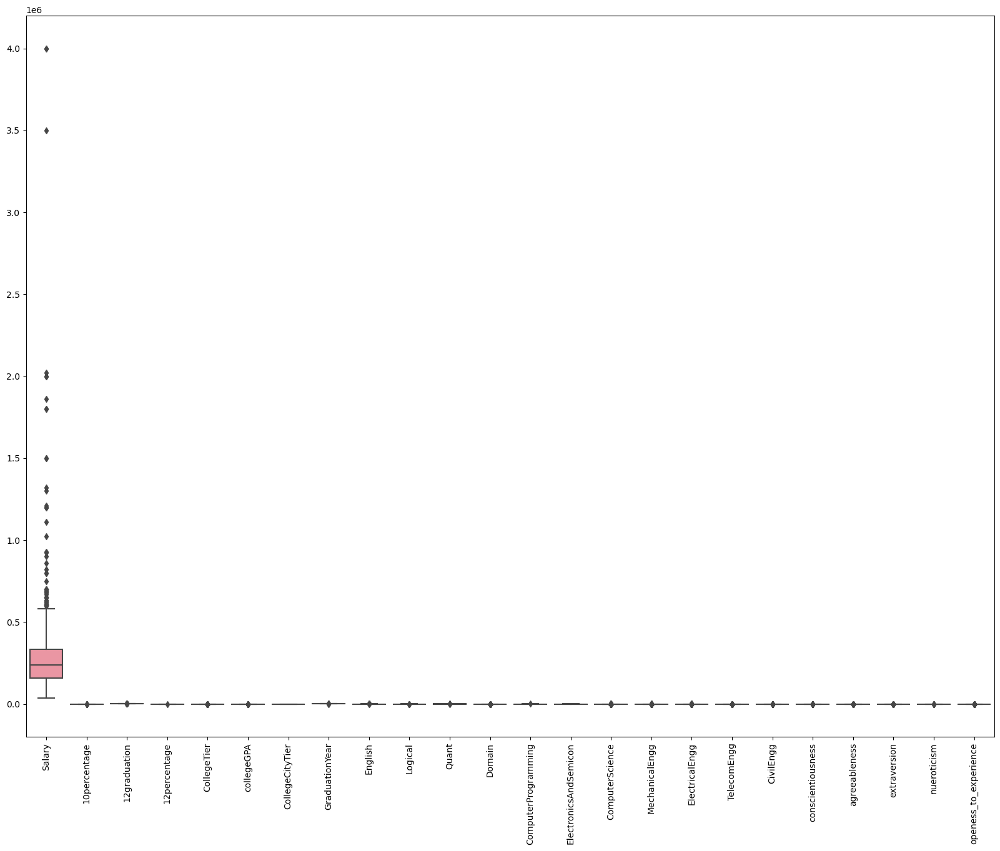

In [22]:
# Boxplot of numerical variables
plt.figure(figsize=(20, 15))
sns.boxplot(data=df, x=None)
plt.xticks(rotation=90)
plt.show()

The boxplot reveals the presence of outliers in the 'Salary' column. These outliers may indicate instances where individuals received exceptionally high salaries compared to others. This variation could stem from factors such as individual negotiation skills, specialized skills or qualifications, or exceptional performance, leading to higher compensation packages for certain individuals.

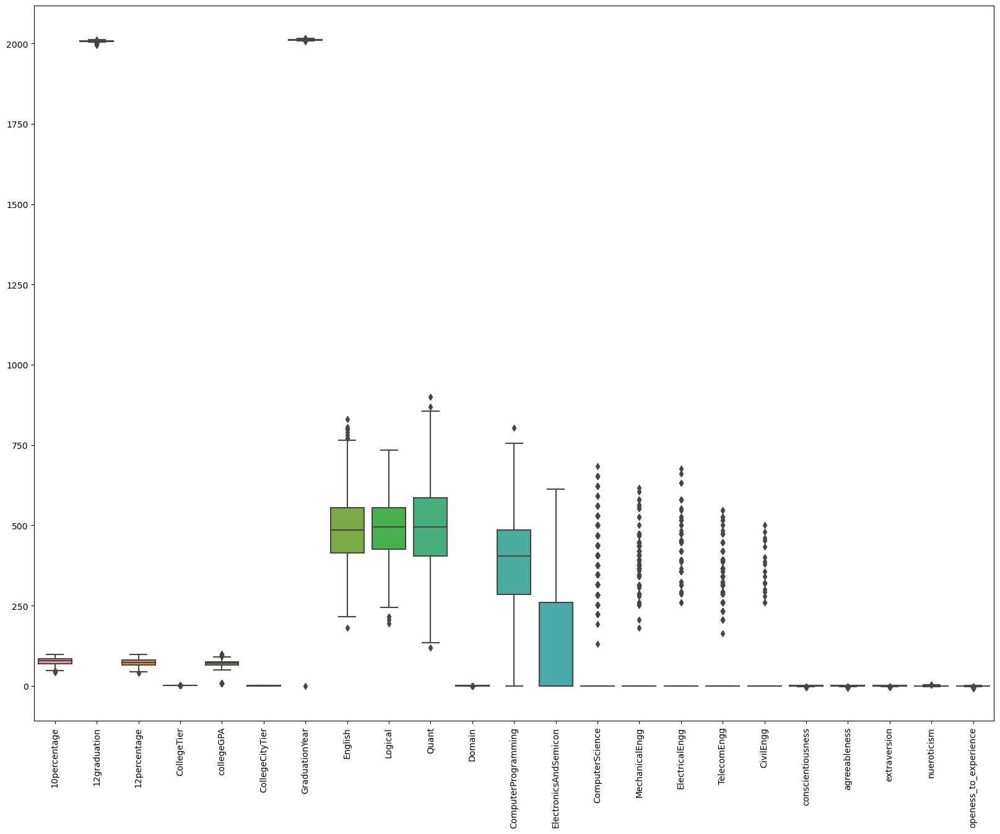

In [23]:
# Boxplot analysis for specific columns
plt.figure(figsize=(20, 15))
sns.boxplot(data=df.drop(['Salary'],axis=1), x=None)
plt.xticks(rotation=90)
plt.show()

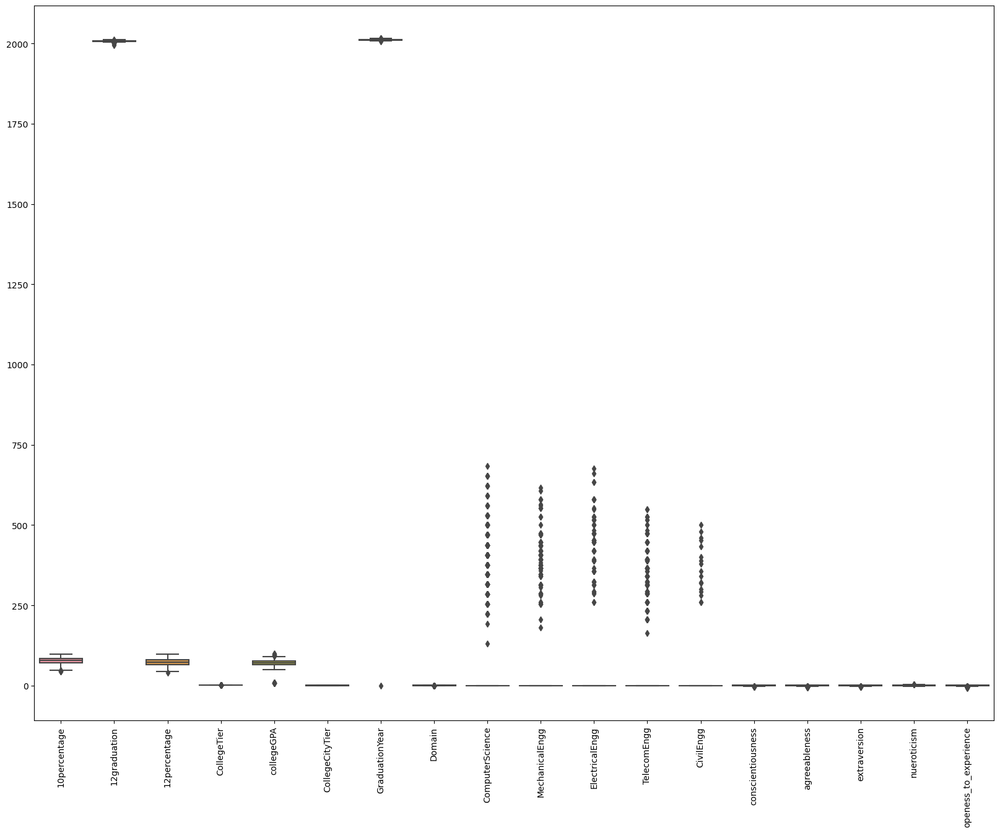

In [24]:
plt.figure(figsize=(20, 15))
sns.boxplot(data=df.drop(['Salary','English','Logical','Quant','ComputerProgramming',
                          'ElectronicsAndSemicon'],axis=1), x=None)
plt.xticks(rotation=90)
plt.show()

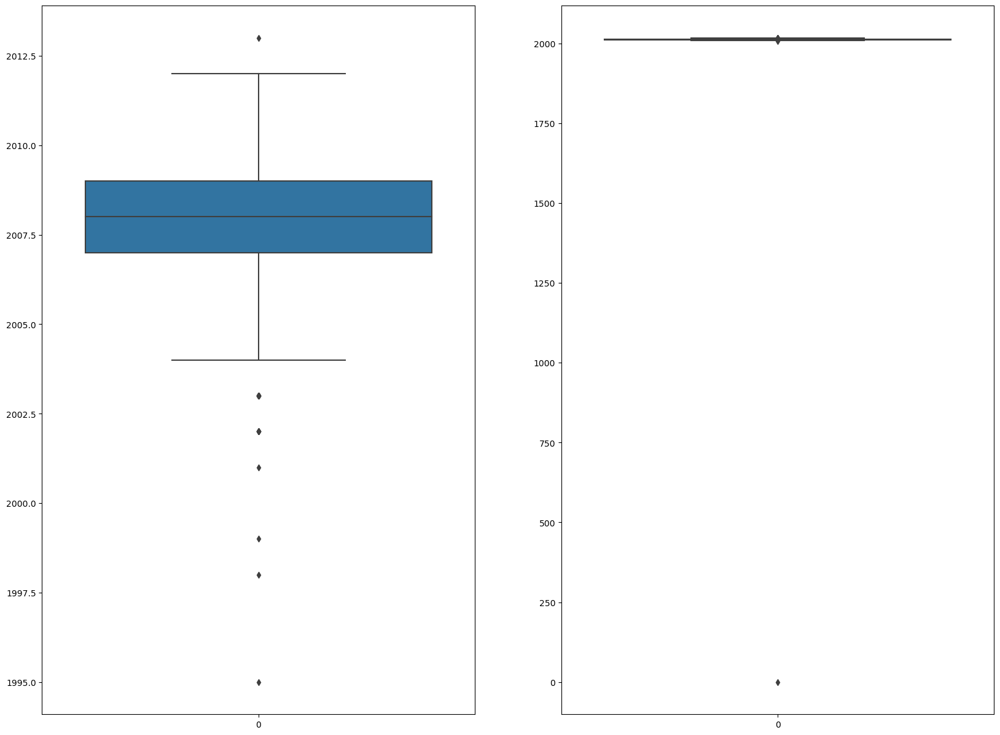

In [25]:
# Boxplot analysis for '12graduation' and 'GraduationYear'
plt.figure(figsize=(20,15))
plt.subplot(1,2,1)
sns.boxplot(data=df['12graduation'], x=None)
plt.subplot(1,2,2)
sns.boxplot(data=df['GraduationYear'], x=None)
plt.show()


In the boxplot analysis, outliers are observed in the 'Graduation Year' column, with one individual graduating in the year 1995. This outlier suggests an anomaly in the dataset, as it is significantly earlier than the typical graduation years observed in the data. 

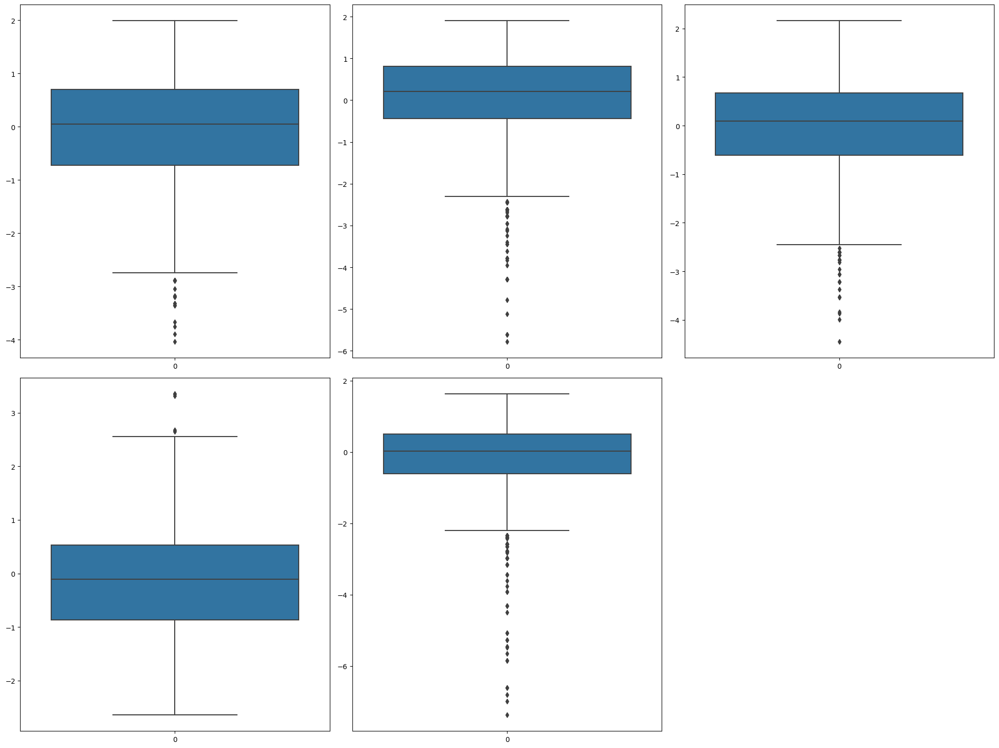

In [26]:
# Boxplot analysis for personality traits

plt.figure(figsize=(20, 15))

plt.subplot(2, 3, 1)
sns.boxplot(data=df['conscientiousness'])

plt.subplot(2, 3, 2)
sns.boxplot(data=df['agreeableness'])

plt.subplot(2, 3, 3)
sns.boxplot(data=df['extraversion'])

# Second row of subplots
plt.subplot(2, 3, 4)
sns.boxplot(data=df['nueroticism'])

plt.subplot(2, 3, 5)
sns.boxplot(data=df['openess_to_experience'])

plt.tight_layout()  # Adjust subplot parameters to give enough space between subplots
plt.show()


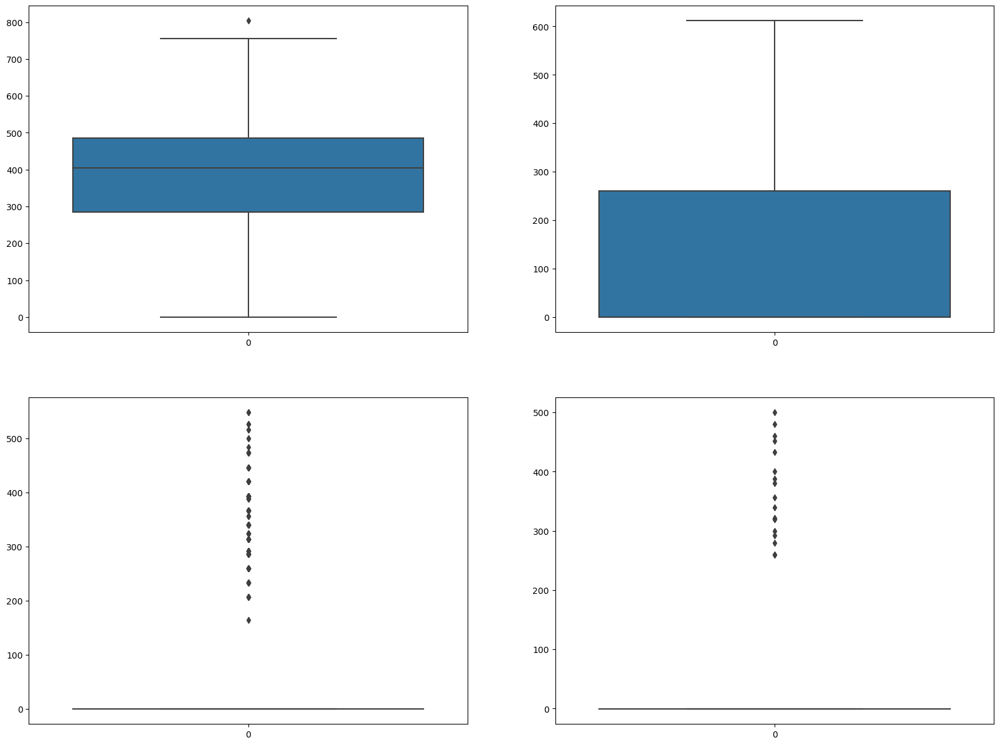

In [27]:
# Boxplot analysis for engineering scores
plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
sns.boxplot(data=df['ComputerProgramming'], x=None)
plt.subplot(2,2,2)
sns.boxplot(data=df['ElectronicsAndSemicon'], x=None)
plt.subplot(2,2,3)
sns.boxplot(data=df['TelecomEngg'], x=None)
plt.subplot(2,2,4)
sns.boxplot(data=df['CivilEngg'], x=None)
plt.show()

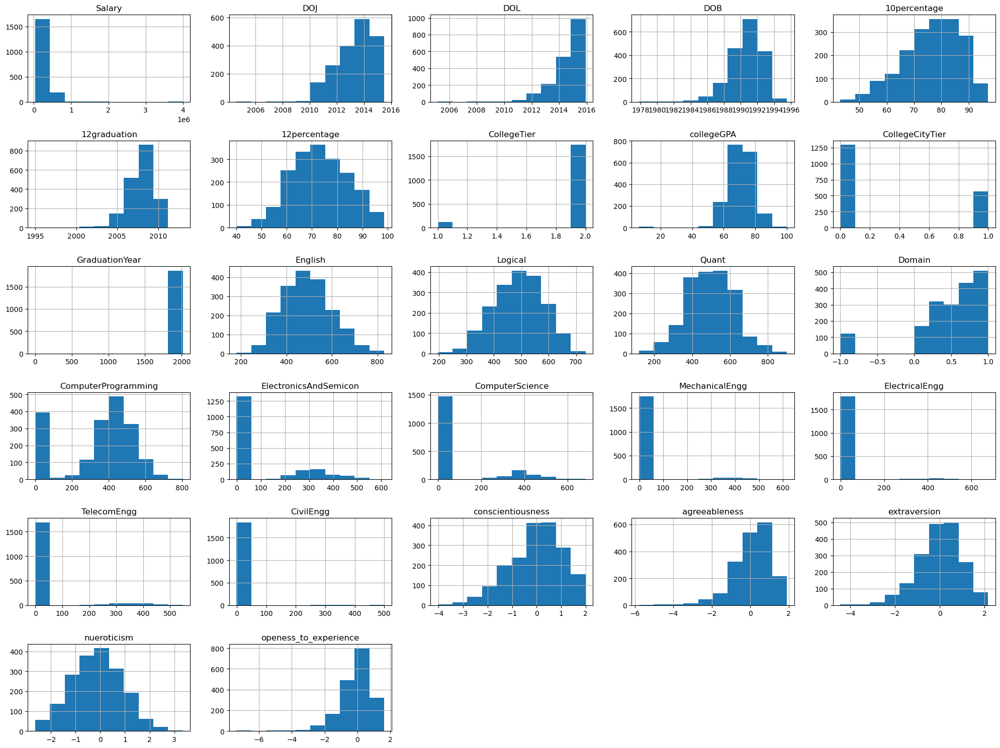

In [28]:
# Histograms for numerical variables
df.hist(figsize=(20,15));
plt.tight_layout()

The histogram plots provide valuable insights into the distribution and trends within the dataset. It is evident that the majority of salaries fall within the range of 0 to 400,000, indicating a concentration of individuals with salaries in this bracket. Regarding dates, most individuals joined between the years 2013 and 2014, while the majority left between 2015 and 2016. Birth years cluster predominantly between 1990 and 1992, suggesting a concentration of individuals born during this period. Furthermore, in terms of academic performance, the highest concentration of individuals scored between 75% and 80% in their 10th standard examinations, and between 70% and 75% in their 12th standard examinations. Lastly, with respect to college tier, the data indicates that a significant proportion of individuals attended colleges categorized as Tier 2. These insights provide a comprehensive understanding of the dataset's characteristics and highlight potential patterns within the data.

In [29]:
# create num_df conatining all dtypes excpet for object
num_df=df.columns[df.dtypes!='object'].tolist()

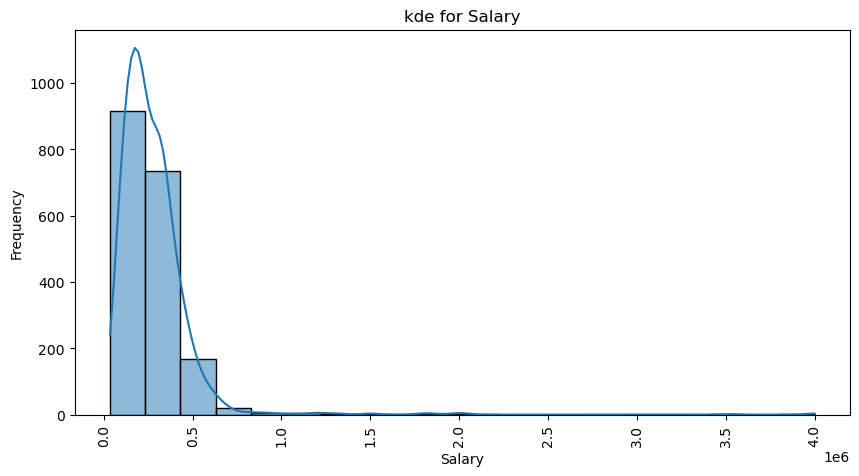

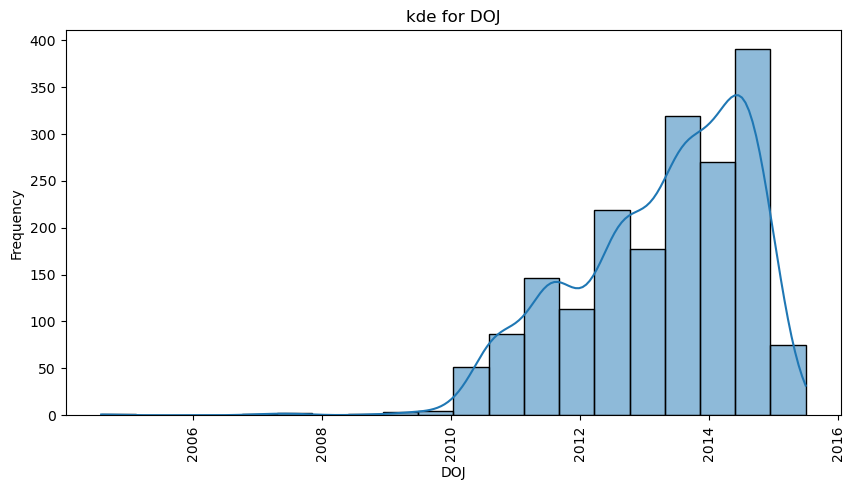

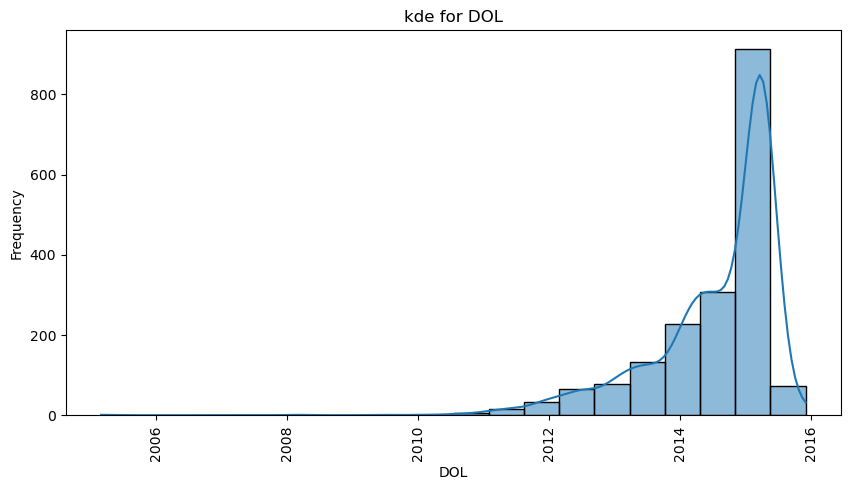

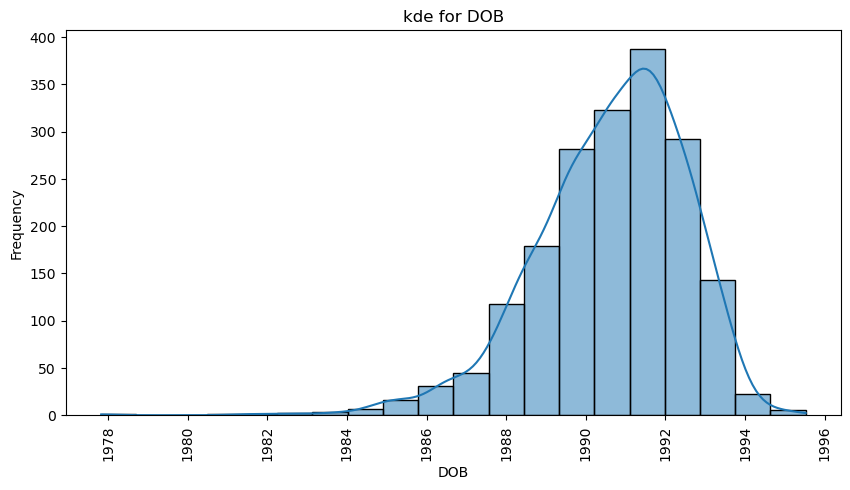

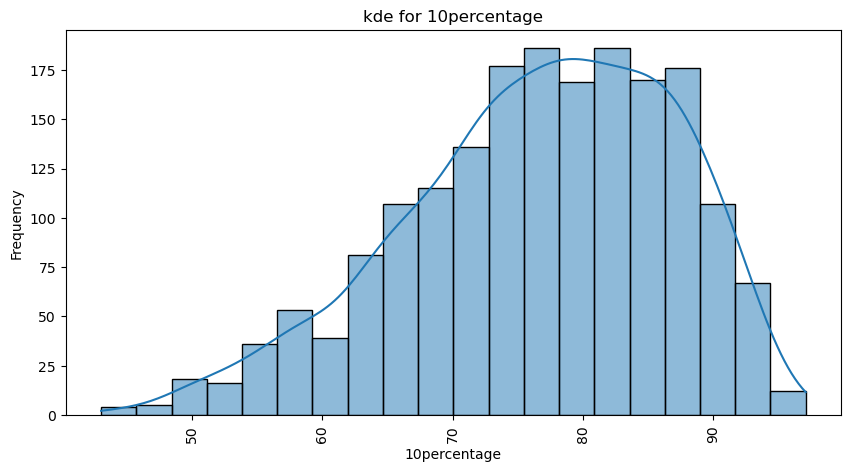

...

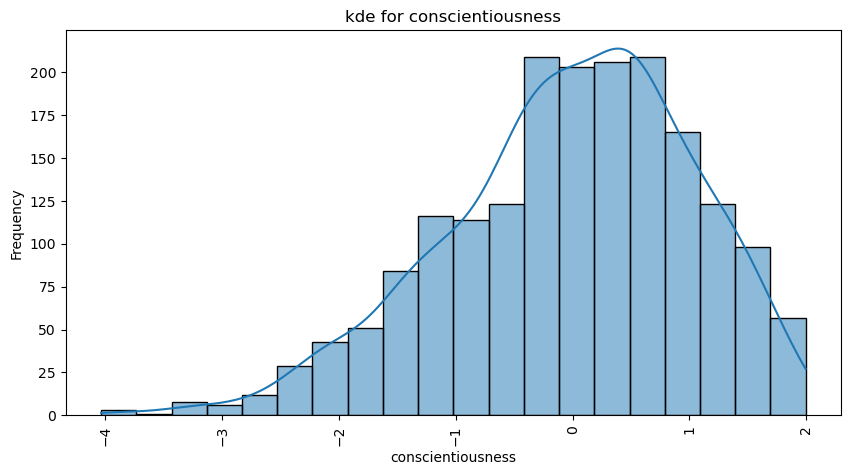

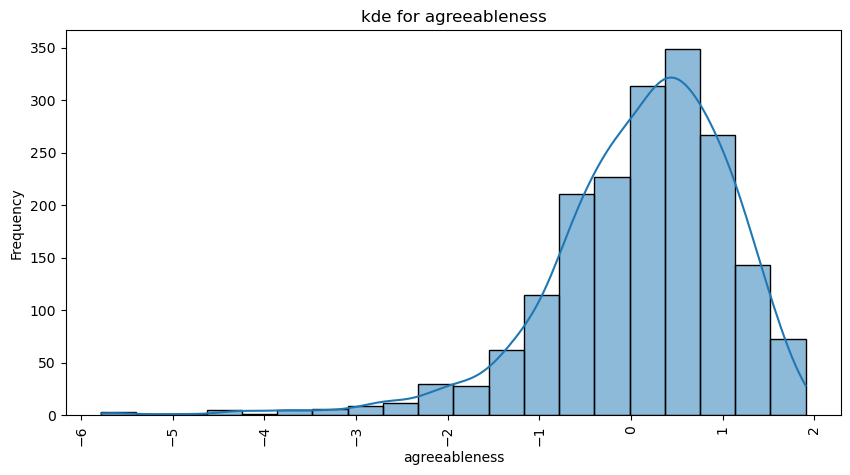

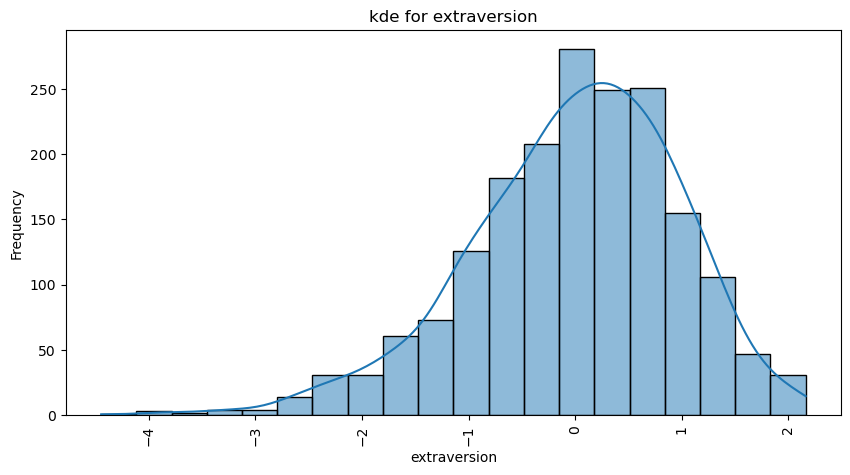

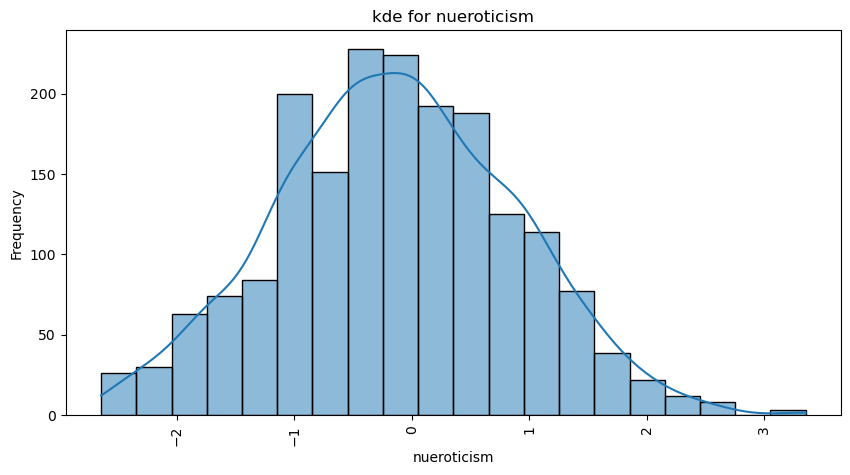

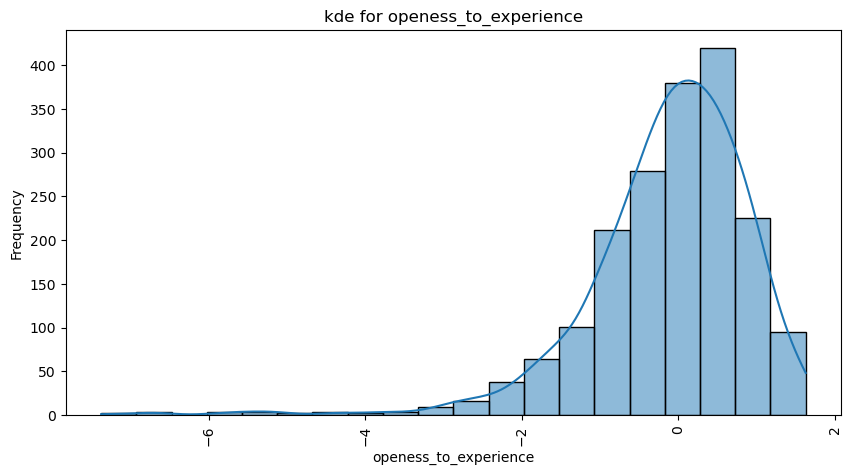

In [30]:
# Histograms for each numerical variable using KDE (Kernel Density Estimation) plots
for col in num_df:
    plt.figure(figsize=(10, 5))
    sns.histplot(data=df[col], kde=True, bins=20)
    plt.title(f'kde for {col}')
    plt.xlabel(col)
    plt.xticks(rotation=90)
    plt.ylabel('Frequency')
    plt.show()

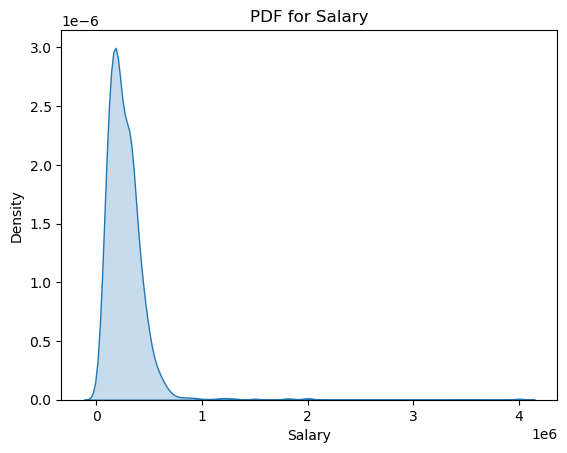

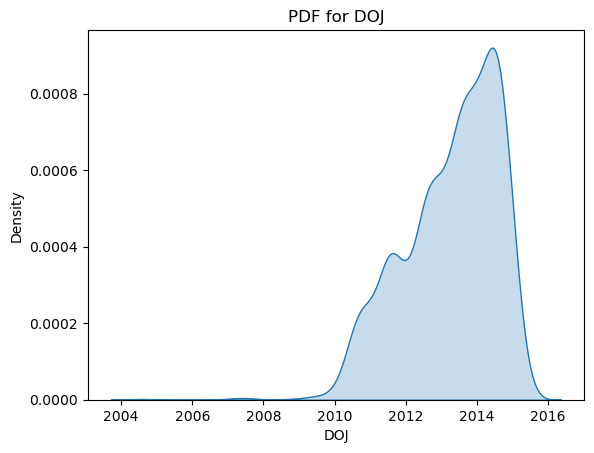

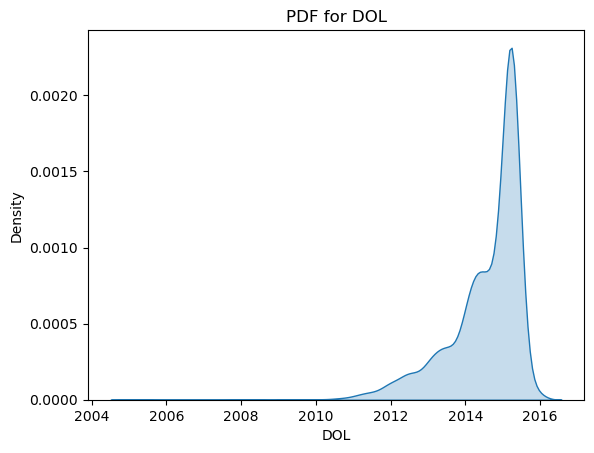

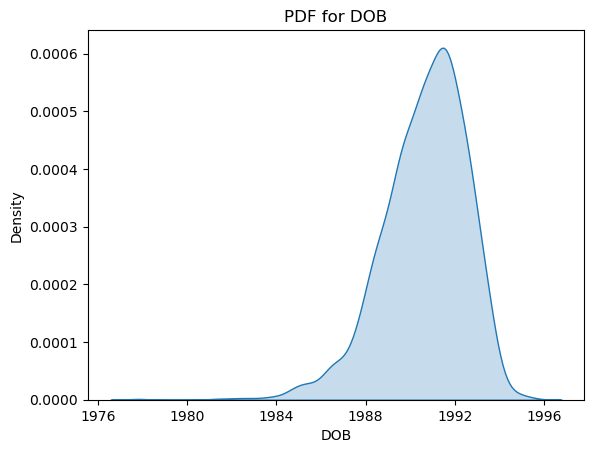

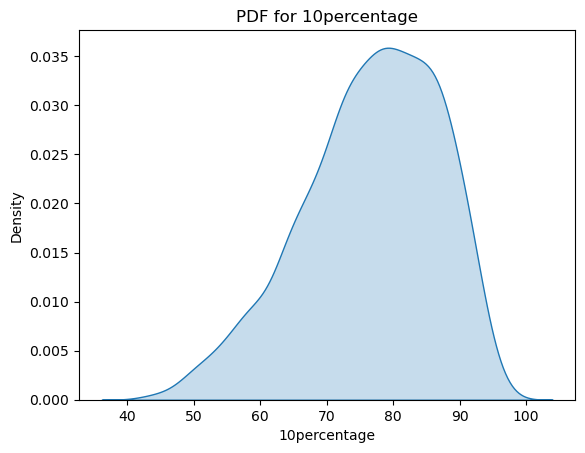

...

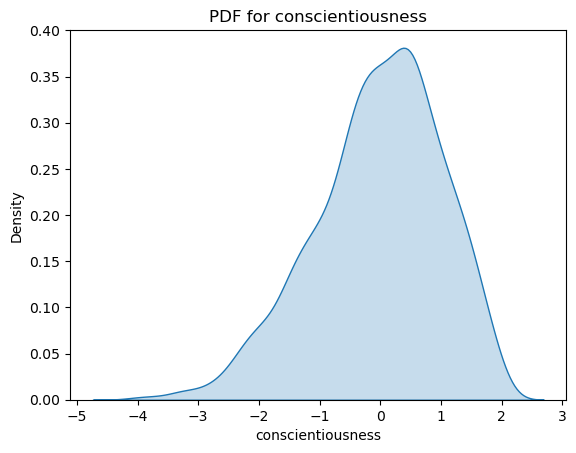

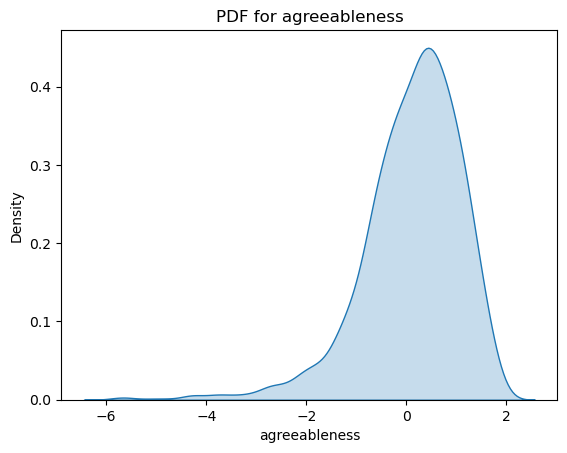

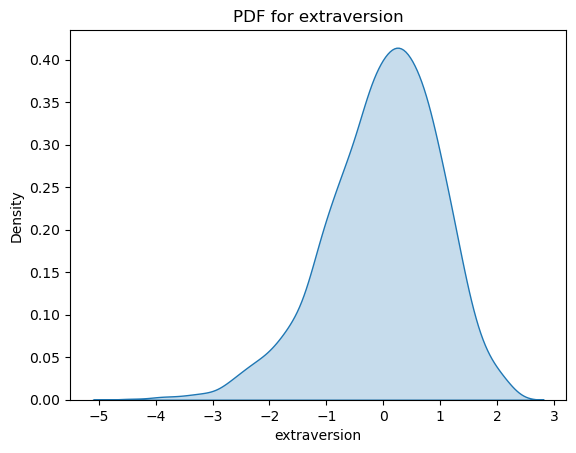

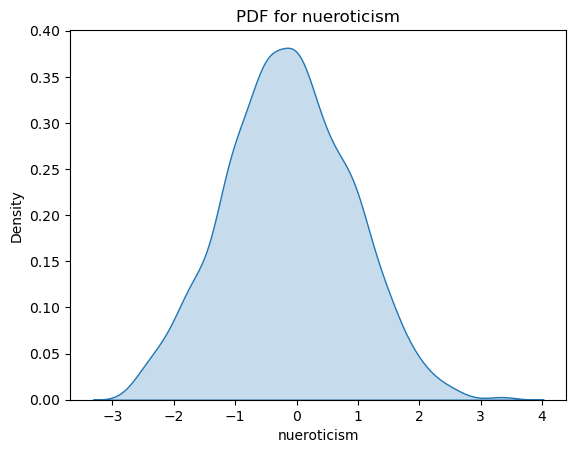

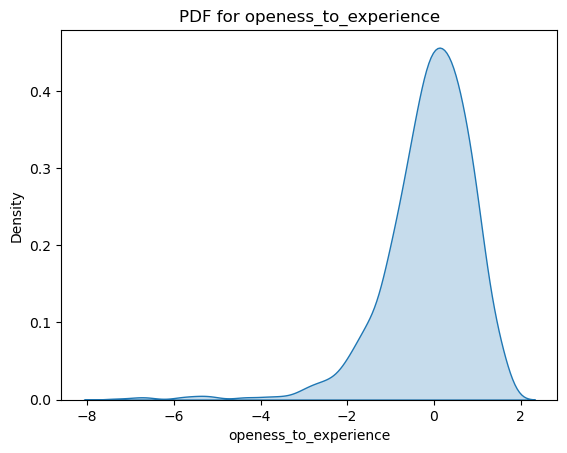

In [31]:
# Kernel Density Estimation (KDE) plots for each numerical variable
for col in num_df:
    sns.kdeplot(data=df[col], fill=True)
    plt.title(f'PDF for {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

The KDE (Kernel Density Estimation) plots offer significant insights into the distribution patterns of various attributes within the dataset. It is observed that attributes such as salary and openness to experience exhibit right-skewed distributions, indicating a concentration of lower values with a tail extending towards higher values. Conversely, attributes such as date of joining (DOJ), date of leaving (DOL), date of birth (DOB), 10th and 12th percentage, and agreeableness demonstrate left-skewed distributions, suggesting a concentration of higher values with a tail extending towards lower values. Notably, attributes like college GPA, English, logical, and quantitative scores, as well as extraversion, demonstrate distributions that closely resemble the normal distribution curve, implying a relatively balanced distribution of values across the dataset. These insights provide valuable information about the characteristics and distribution patterns of various attributes, aiding in further analysis and interpretation of the dataset.

In [32]:
# Count plot for each categorical variable
cat_df=df.columns[df.dtypes=='object'].tolist()
catt_df=cat_df[5:]

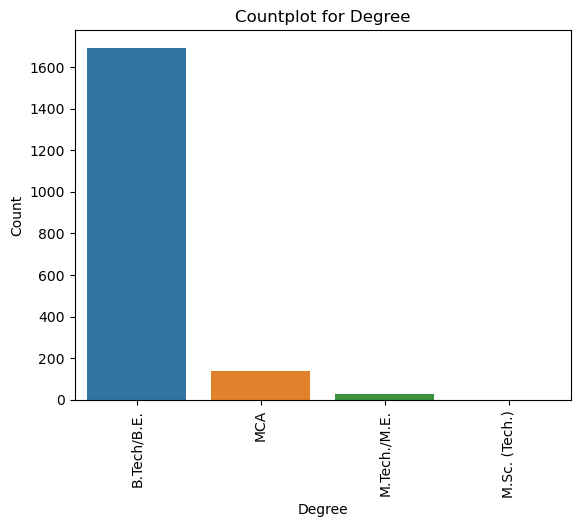

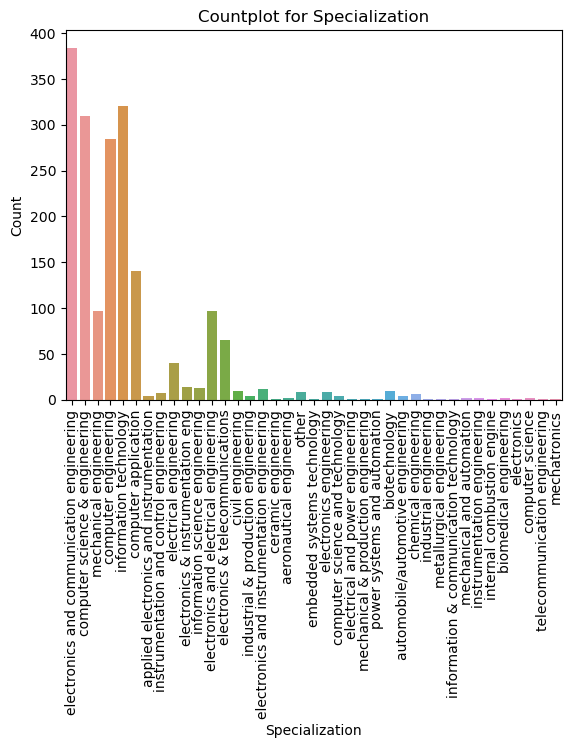

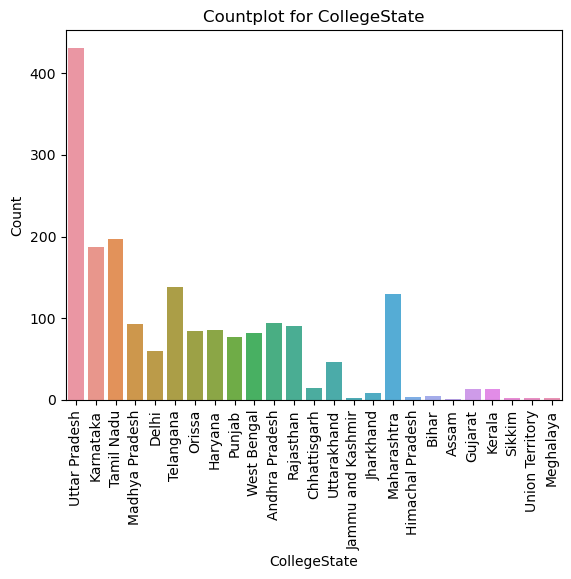

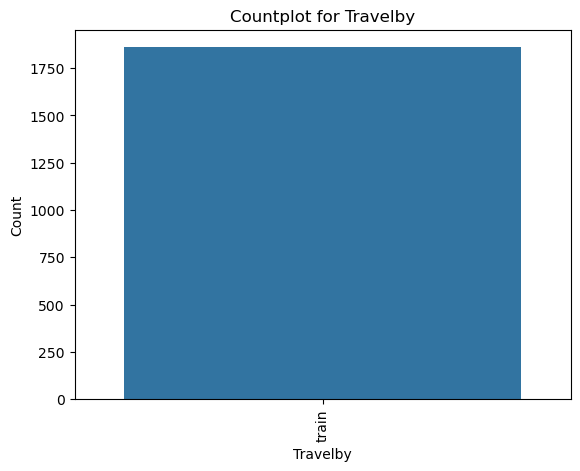

In [33]:
for col in catt_df:
    sns.countplot(data=df, x=col)
    plt.title(f'Countplot for {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()

The count plot analysis reveals notable trends within the dataset. In the 'Degree' column, it is apparent that the majority of individuals hold a B.Tech/B.E degree, while fewer individuals possess an M.Sc(Tech) degree. Moving to the 'Specialization' column, it is observed that the most common specialization among individuals is Electronics and Communication Engineering. Additionally, in the 'College State' column, the data indicates that the highest number of individuals hail from Uttar Pradesh. These insights provide valuable information about the educational backgrounds and geographic distribution of individuals within the dataset, aiding in understanding the overall composition and characteristics of the data.

In [34]:
df['Designation'].value_counts()

Designation
software engineer                    219
software developer                   130
system engineer                       86
programmer analyst                    53
java software engineer                52
                                    ... 
human resources intern                 1
senior quality assurance engineer      1
clerical assistant                     1
software enginner                      1
help desk analyst                      1
Name: count, Length: 317, dtype: int64

In [35]:
df['Designation'].value_counts()

Designation
software engineer                    219
software developer                   130
system engineer                       86
programmer analyst                    53
java software engineer                52
                                    ... 
human resources intern                 1
senior quality assurance engineer      1
clerical assistant                     1
software enginner                      1
help desk analyst                      1
Name: count, Length: 317, dtype: int64

In [36]:
df['JobCity'].value_counts()

JobCity
Bangalore           303
Noida               186
Hyderabad           162
Chennai             137
Pune                135
                   ... 
BAngalore             1
india                 1
Tirunelvelli          1
Ernakulam             1
Asifabadbanglore      1
Name: count, Length: 245, dtype: int64

In [37]:
df['10board'].value_counts()

10board
cbse                                                            597
state board                                                     519
0                                                               194
icse                                                            118
ssc                                                              63
                                                               ... 
stjoseph of cluny matrhrsecschool,neyveli,cuddalore district      1
karnataka secondary board                                         1
state board of karnataka                                          1
u p                                                               1
bihar school examination board                                    1
Name: count, Length: 176, dtype: int64

In [38]:
df['12board'].value_counts()

12board
cbse                   591
state board            557
0                      199
icse                    55
up board                45
                      ... 
aissce                   1
cicse                    1
 upboard                 1
karnataka board          1
boardofintermediate      1
Name: count, Length: 223, dtype: int64

### Bivariate analysis

<Axes: >

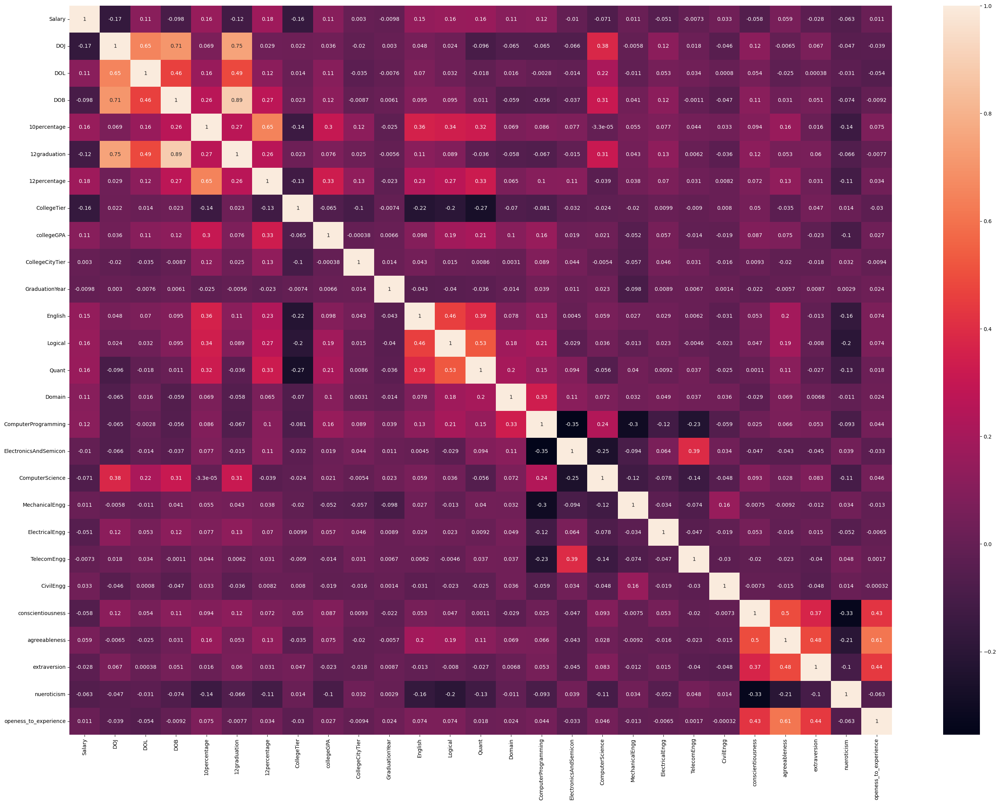

In [39]:
# Heatmap for correlation matrix of numerical variables
plt.figure(figsize=(35,25))
sns.heatmap(df[num_df].corr(),annot=True)

The heatmap analysis reveals notable correlations between several numerical variables within the dataset. Specifically, strong positive correlations are observed among attributes such as English, Logical, 10th Percentage, 12th Percentage, College GPA, Computer Science, and Salary. Additionally, there are correlations between these attributes and personality traits such as conscientiousness, agreeableness, extraversion, neuroticism, and openness to experience. These findings suggest potential relationships between academic performance, technical skills, personality traits, and salary levels within the dataset.

In [40]:
a=['conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience','10percentage','12percentage',
    'collegeGPA','English','Logical','Quant','ComputerProgramming','ComputerScience','Salary']

<Figure size 3000x2500 with 0 Axes>

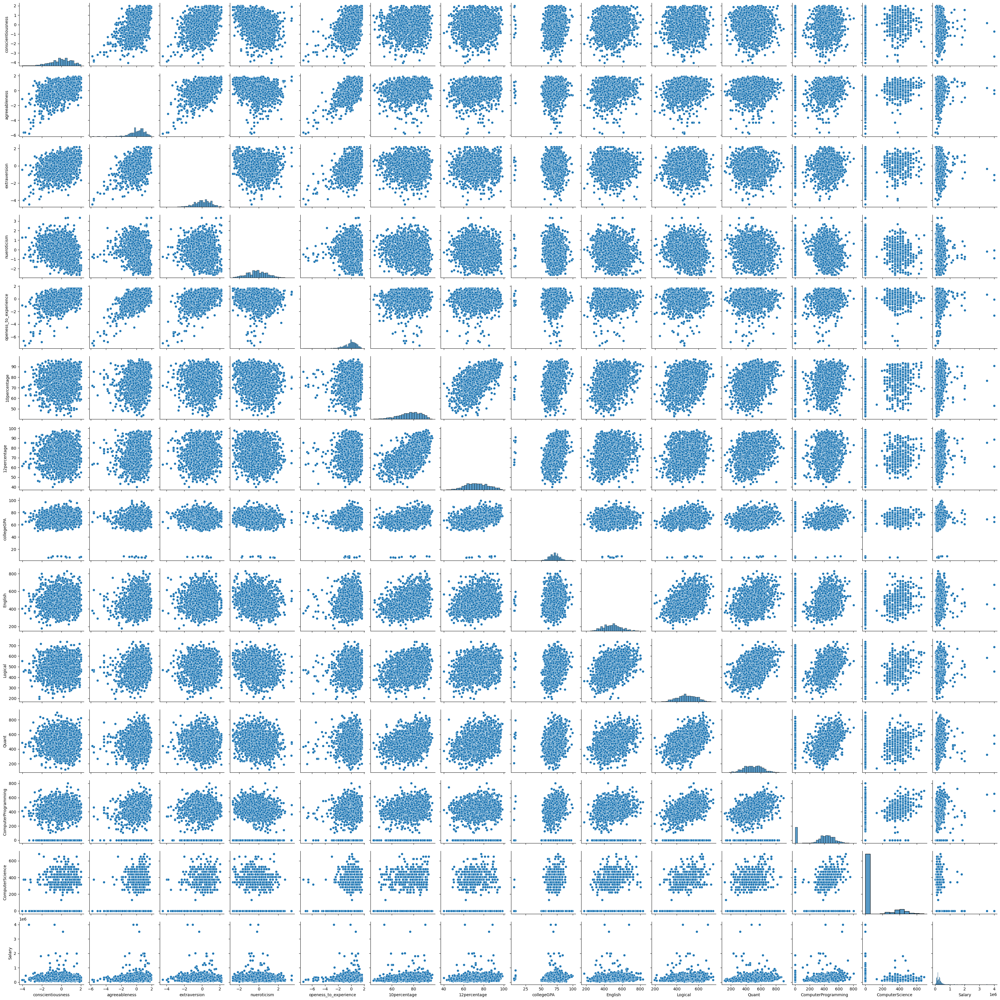

In [41]:
# Pairplot for selected numerical variables
plt.figure(figsize=(30,25))
sns.pairplot(df[a]);

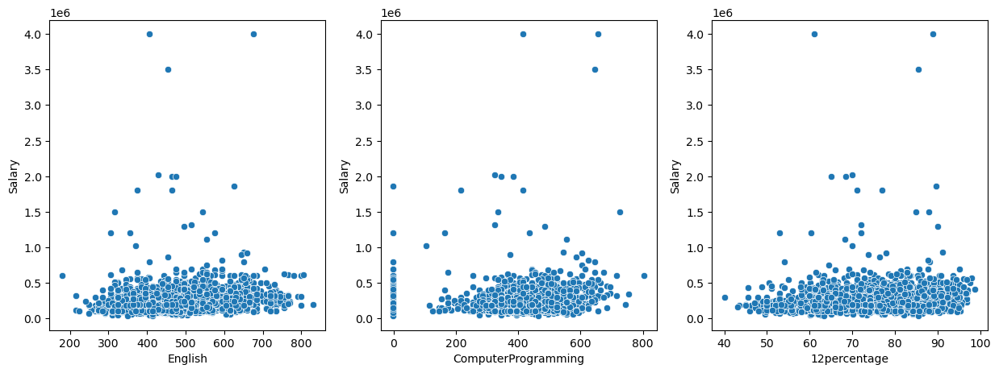

In [42]:
# Scatter plots for specific numerical variables against salary
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.scatterplot(x=df['English'],y=df['Salary'])
plt.subplot(1,3,2)
sns.scatterplot(x=df['ComputerProgramming'],y=df['Salary'])
plt.subplot(1,3,3)
sns.scatterplot(x=df['12percentage'],y=df['Salary']);

The scatter plot analysis highlights notable relationships between certain attributes and salary within the dataset. Specifically, significant correlations are observed between English scores, Computer Programming scores, 12th Percentage, and salary levels. This suggests that individuals with higher scores in English and Computer Programming, as well as those with higher 12th Percentage, tend to command higher salaries. These findings indicate the potential importance of academic performance and technical skills in determining salary levels within the dataset.

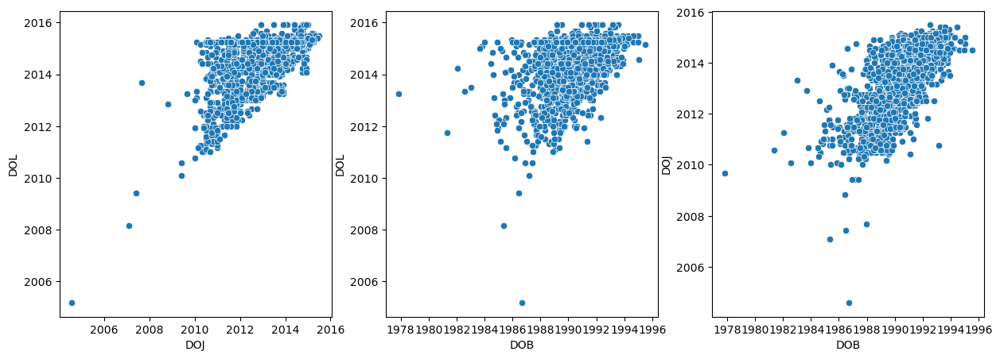

In [43]:
# Scatter plots for temporal variables
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.scatterplot(x=df['DOJ'],y=df['DOL'])
plt.subplot(1,3,2)
sns.scatterplot(x=df['DOB'],y=df['DOL'])
plt.subplot(1,3,3)
sns.scatterplot(x=df['DOB'],y=df['DOJ']);

The scatter plots indicate notable relationships between certain pairs of variables. Specifically, there appears to be a discernible relationship between the Date of Joining (DOJ) and Date of Leaving (DOL), as well as between the Date of Birth (DOB) and both the Date of Joining (DOJ) and Date of Leaving (DOL). These relationships suggest potential patterns or dependencies between these temporal variables.

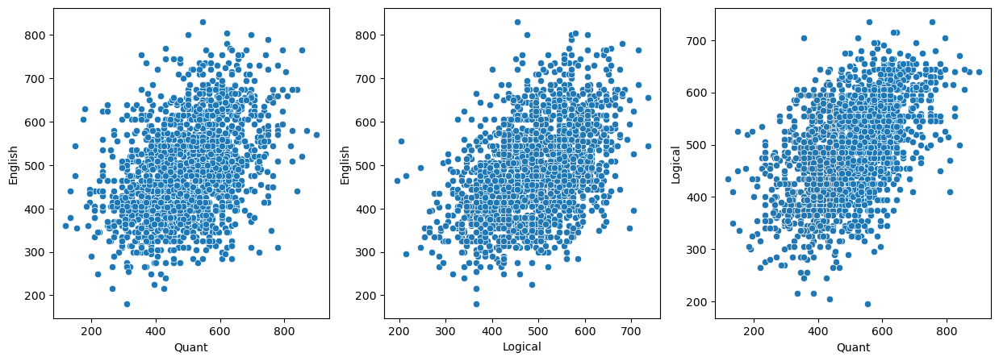

In [44]:
# Scatter plots for specific pairs of numerical variables
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.scatterplot(x=df['Quant'],y=df['English'])
plt.subplot(1,3,2)
sns.scatterplot(x=df['Logical'],y=df['English'])
plt.subplot(1,3,3)
sns.scatterplot(x=df['Quant'],y=df['Logical']);

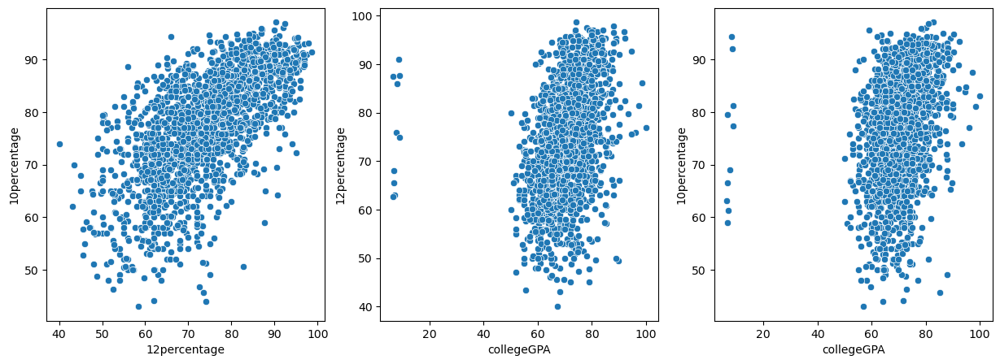

In [45]:
# Scatter plots for specific pairs of numerical variables
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
sns.scatterplot(x=df['12percentage'],y=df['10percentage'])
plt.subplot(1,3,2)
sns.scatterplot(x=df['collegeGPA'],y=df['12percentage'])
plt.subplot(1,3,3)
sns.scatterplot(x=df['collegeGPA'],y=df['10percentage']);

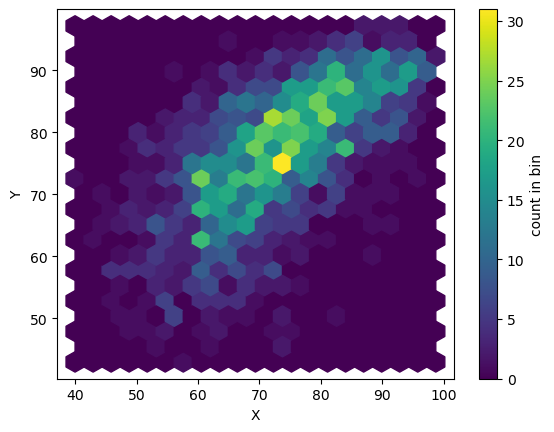

In [46]:
# hexbin plots for specific pairs of numerical variables
plt.hexbin(df['12percentage'], df['10percentage'], gridsize=20)
plt.xlabel('X')
plt.ylabel('Y')
plt.colorbar(label='count in bin')
plt.show()

In [47]:
# Create salary bins
bins = [0, 100000, 150000, 200000, 250000, 300000, 350000, 400000, float('inf')]
labels = ['<1L', '1L - 1.5L', '1.5L - 2L', '2L - 2.5L', '2.5L - 3L', '3L - 3.5L', '3.5L - 4L', '4L+']

df['Salary_bin'] = pd.cut(df['Salary'], bins=bins, labels=labels, right=False)

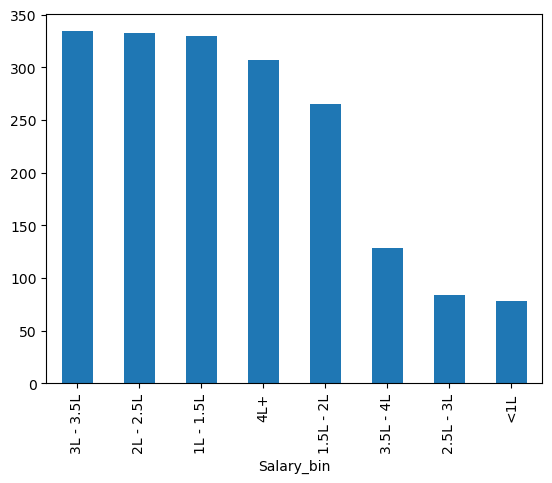

In [48]:
# Plot bar graph for salary bins
df['Salary_bin'].value_counts().plot.bar();

The bar graph illustrates that the majority of individuals fall within the salary range of 2-2.5 lakhs, while the smallest proportion of individuals earn less than 1 lakh. This distribution provides insight into the salary distribution within the dataset, with a concentration of individuals earning within the specified range. Additionally, it highlights the variability in salary levels among individuals, emphasizing the presence of different income brackets within the dataset.

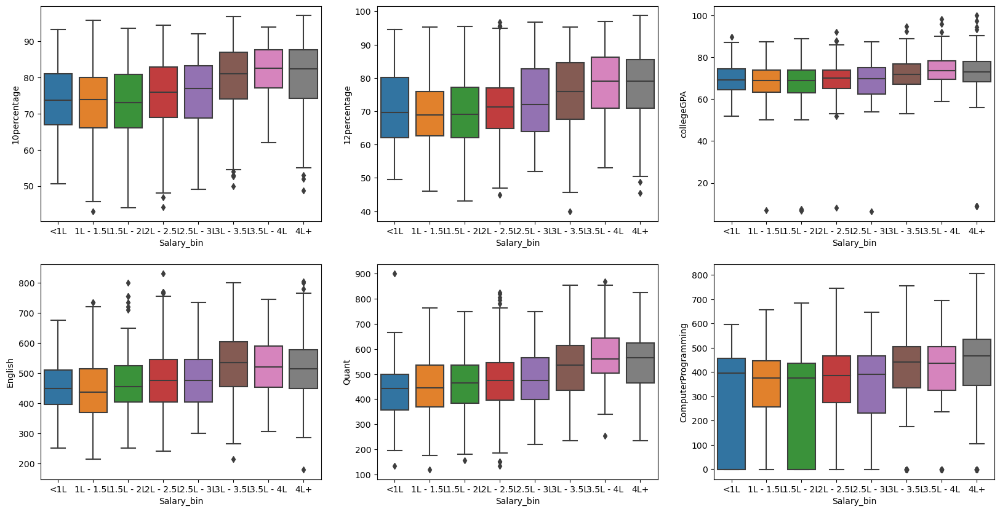

In [49]:
# Boxplots for numerical variables against salary bins
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
sns.boxplot(x='Salary_bin', y='10percentage', data=df)
plt.subplot(2,3,2)
sns.boxplot(x='Salary_bin', y='12percentage', data=df)
plt.subplot(2,3,3)
sns.boxplot(x='Salary_bin', y='collegeGPA', data=df)
plt.subplot(2,3,4)
sns.boxplot(x='Salary_bin', y='English', data=df)
plt.subplot(2,3,5)
sns.boxplot(x='Salary_bin', y='Quant', data=df)
plt.subplot(2,3,6)
sns.boxplot(x='Salary_bin', y='ComputerProgramming', data=df)
plt.show()

The above boxplot analysis suggests notable relationships between categorical and numerical variables within the dataset. Specifically, it indicates that individuals with a 10th percentage greater than 80 tend to have a salary in the range of 3.5-4 lakhs. Similarly, individuals with a 12th percentage greater than 80 tend to have a salary in the range of 3.5-4 lakhs or even higher. Moreover, individuals scoring in the range of 500 to 550 in English also tend to have a salary in the range of 3-3.5 lakhs. These observations highlight potential associations between academic performance and salary levels, providing insights into factors that may influence earning potential within the dataset.

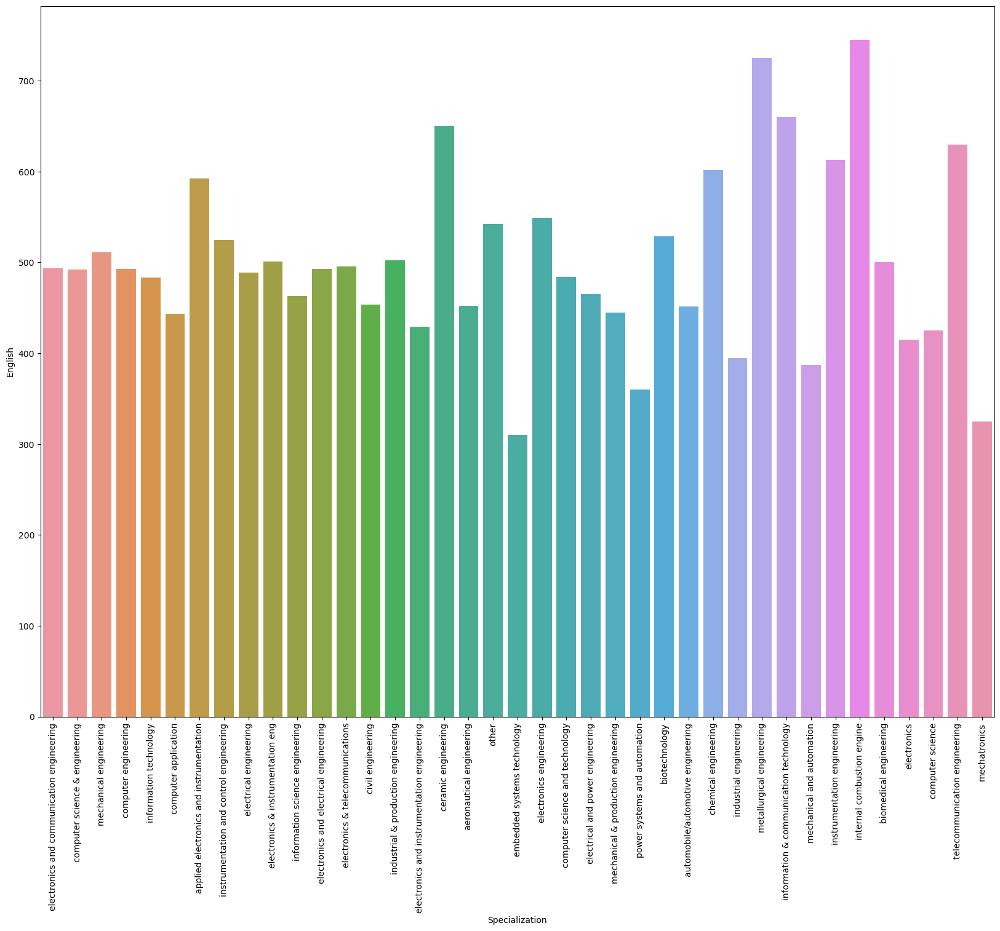

In [50]:
# Bar plot for specialization and English scores
plt.figure(figsize=(20,15))
sns.barplot(x='Specialization', y='English', data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The above bar plot comparing specialization and English scores reveals that "Internal Combustion Engine" specialization has the highest English scores, while "Embedded Systems Technology" specialization has the lowest scores. This insight suggests variations in English proficiency across different specializations within the dataset.

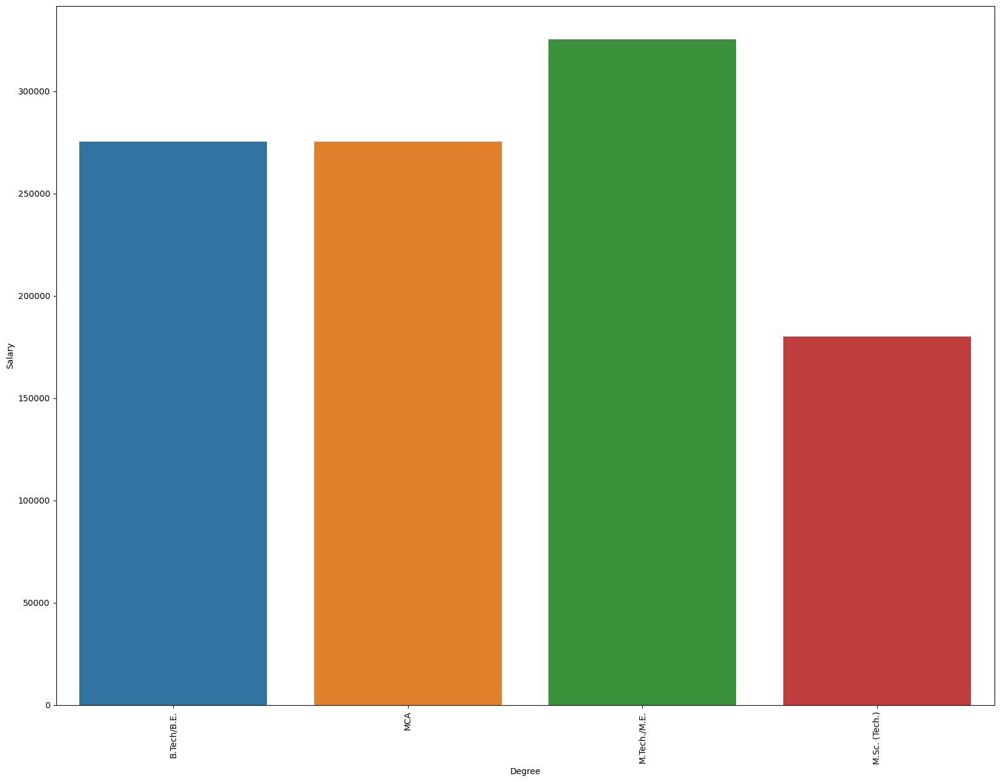

In [51]:
# Bar plot for degree and salary
plt.figure(figsize=(20,15))
sns.barplot(x='Degree', y='Salary',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The above bar plot comparing degree and salary indicates that individuals with an M.Tech/M.E degree tend to have the highest salaries, while those with an M.Sc(Tech) degree tend to have the lowest salaries. This insight suggests variations in salary levels among different degrees within the dataset.

In [52]:
# lest create desi variavles containing grouped designation
desi=pd.DataFrame(df.groupby('Designation')['Salary'].sum())

In [53]:
# creating pivot tabel
pd.pivot_table(df,index='Designation',columns='Gender',values='Salary')

Gender,f,m
Designation,,
.net developer,268000.000000,179062.500000
.net web developer,NaN,180000.000000
account executive,192500.000000,NaN
administrative support,200000.000000,NaN
aircraft technician,100000.000000,NaN
...,...,...
web designer and seo,200000.000000,NaN
web developer,161666.666667,167916.666667
web intern,205000.000000,NaN


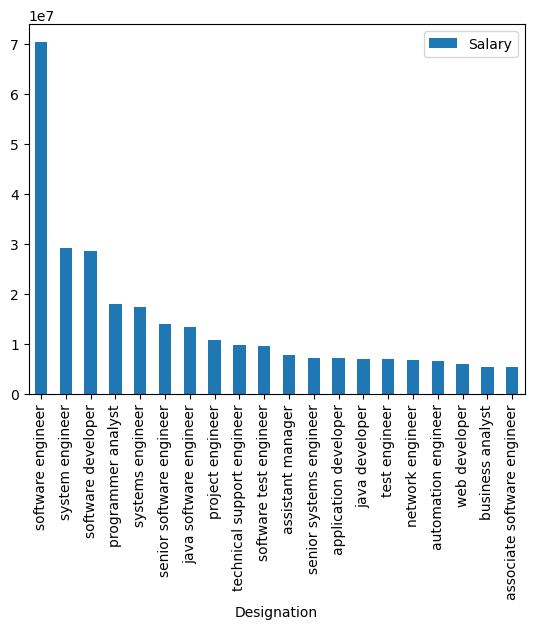

In [54]:
# Bar plot for top 20 designations and salary
desi.sort_values(by='Salary',ascending=False).head(20).plot.bar();

The above bar plot illustrating the relationship between designation and salary highlights that "Software Engineer" holds the highest salary among the listed designations, followed by "Software Developer" with the second-highest salary.

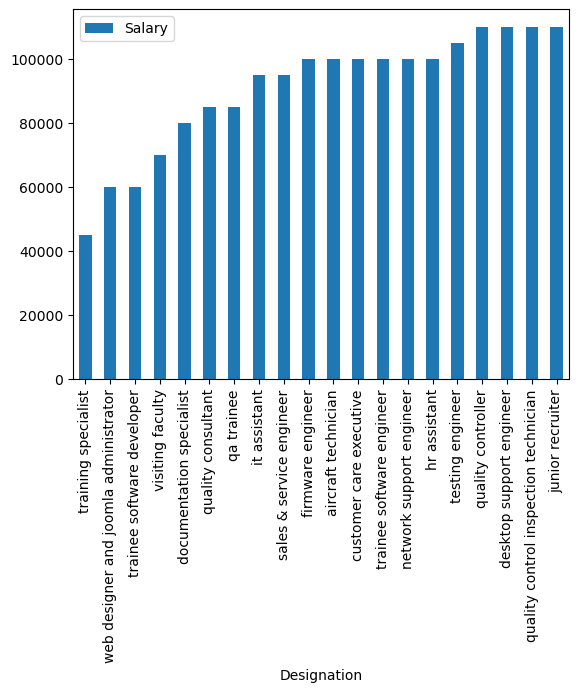

In [55]:
# Bar plot for bottom 20 designations and salary
desi.sort_values(by='Salary',ascending=True).head(20).plot.bar();

The above bar plot depicting designation and salary reveals that individuals holding the designation of "Secretary" tend to have the lowest salaries within the dataset.

In [57]:
# creating city variavle containing the grouped jobcity
city=pd.DataFrame(df.groupby('JobCity')['Salary'].sum())

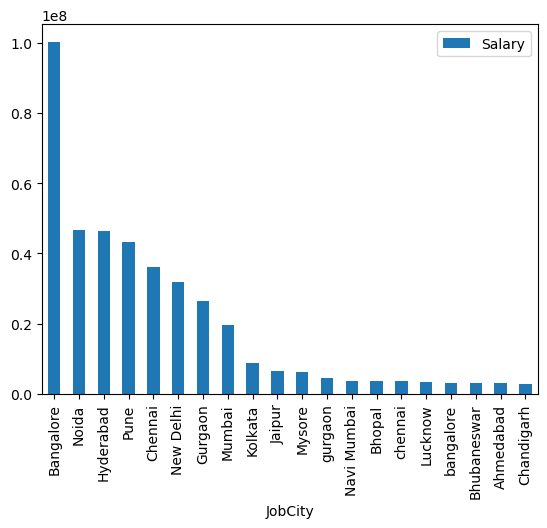

In [58]:
# Bar plot for top 20 jobcity and salary
city.sort_values(by='Salary',ascending=False).head(20).plot.bar();

The above bar plot representing job city and salary indicates that individuals residing in Bangalore tend to have the highest salaries, while Noida ranks as the second-highest in terms of salary levels.

<Axes: xlabel='JobCity'>

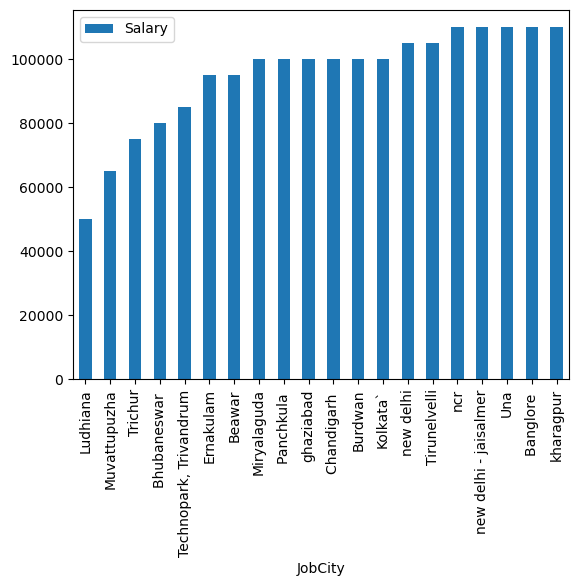

In [89]:
# Bar plot for bottom 20 jobcity and salary
city.sort_values(by='Salary',ascending=True).head(20).plot.bar()

The above bar plot representing job city and salary indicates that individuals residing in Ludhiana tend to have the lowest salaries.

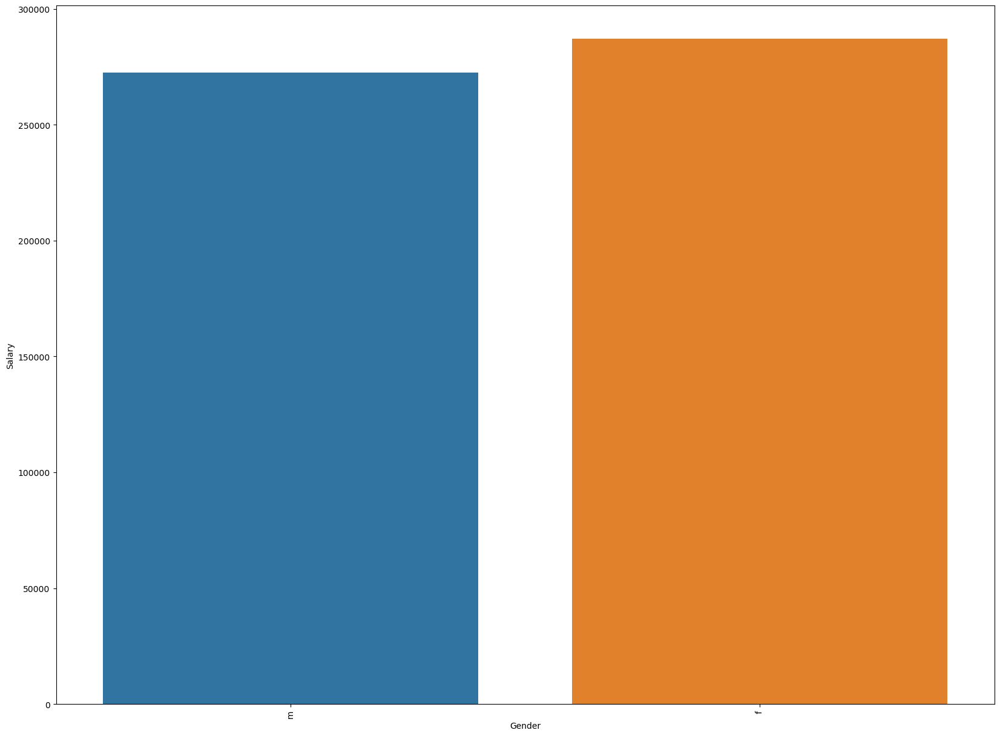

In [91]:
# Bar plot for gender and salary
plt.figure(figsize=(20,15))
sns.barplot(x='Gender', y='Salary',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The bar plot illustrating the relationship between gender and salary suggests that females tend to have higher earnings compared to males within the dataset.

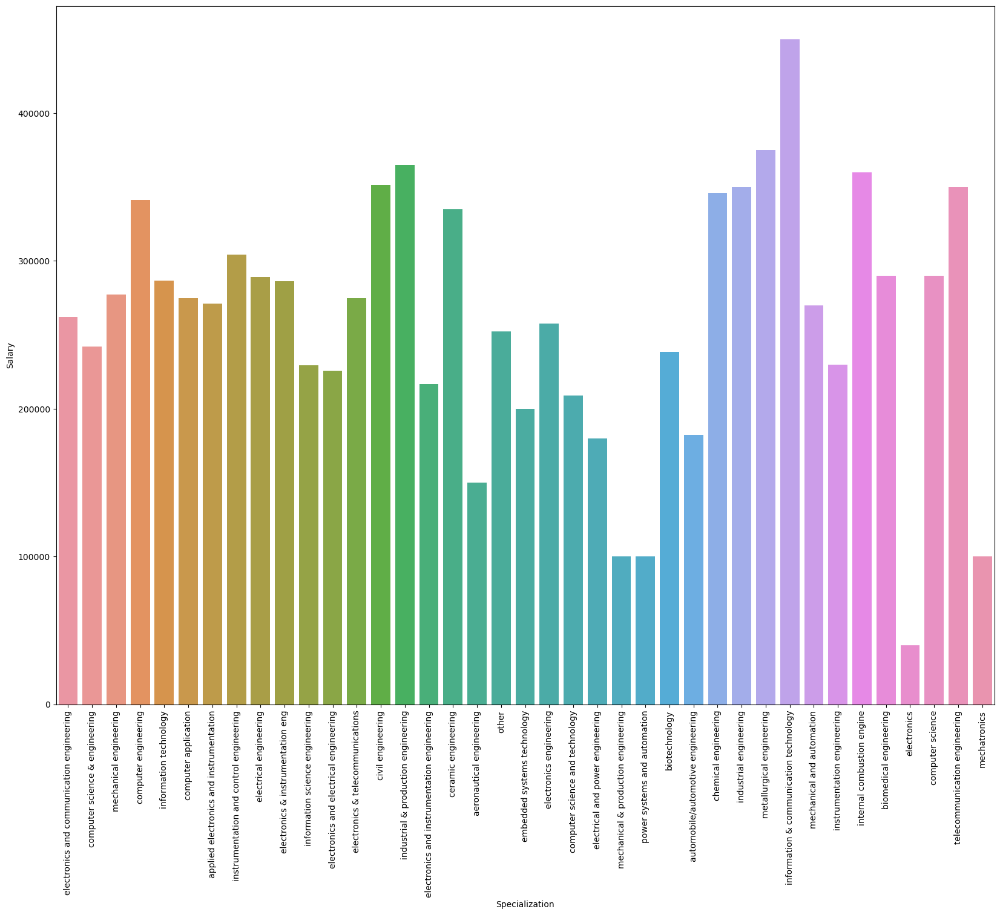

In [61]:
# Bar plot for specialization and salary
plt.figure(figsize=(20,15))
sns.barplot(x='Specialization', y='Salary',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The bar plot comparing specialization and salary indicates that individuals specializing in Information and Communication Technology tend to have the highest salaries, while those specializing in Electronics have the lowest salaries within the dataset.

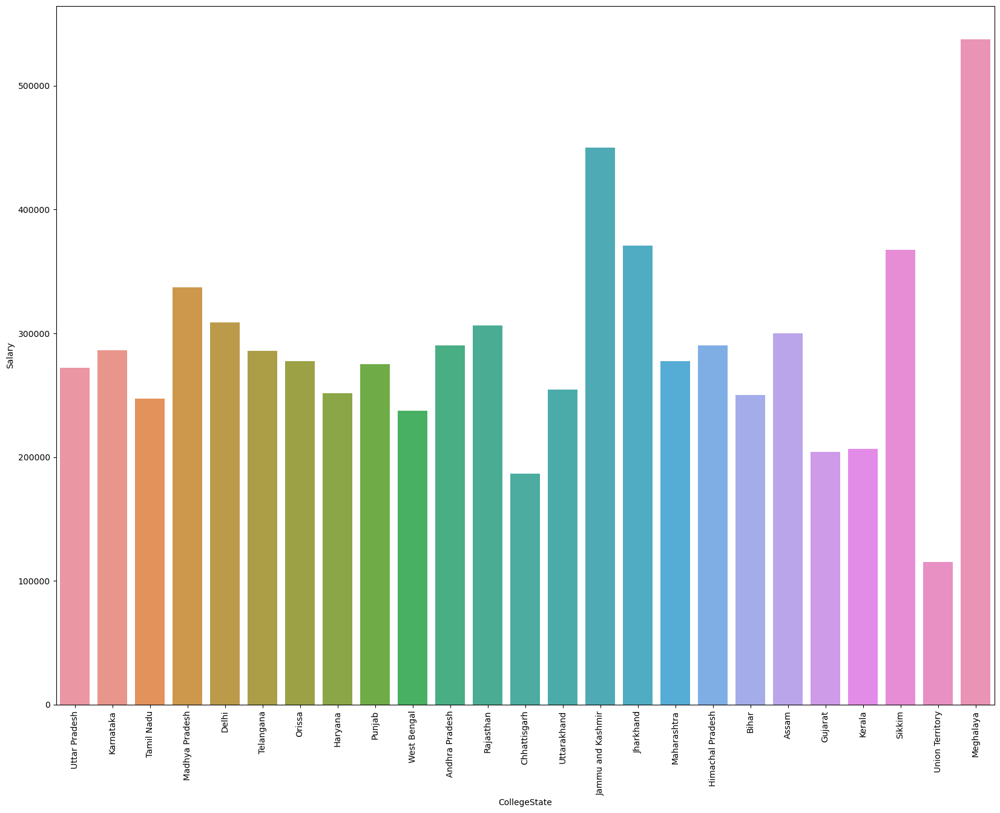

In [62]:
# Bar plot for college state and salary
plt.figure(figsize=(20,15))
sns.barplot(x='CollegeState', y='Salary',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The bar plot examining college state and salary suggests that individuals who attended college in Meghalaya tend to have the highest salaries, while those from Union Territories have the lowest salaries within the dataset.

In [63]:
# stacked bar plot for specialization and college states
stacked_data=df.groupby(['Specialization','CollegeState']).size().unstack()

<Figure size 2000x1500 with 0 Axes>

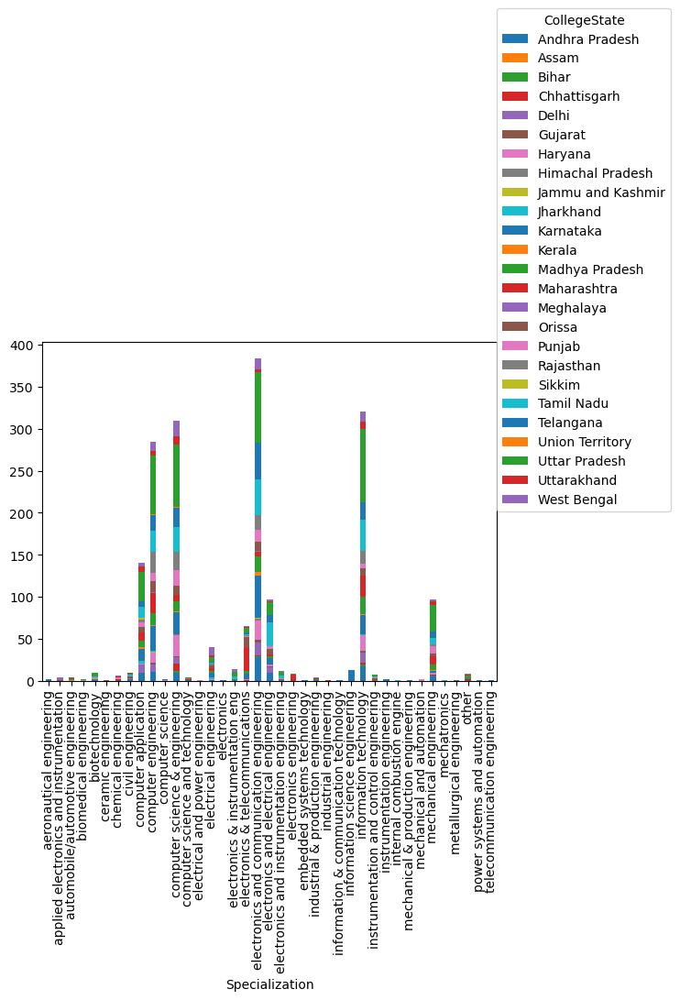

In [64]:
plt.figure(figsize=(20,15))
stacked_data.plot(kind='bar', stacked=True)
plt.legend(title='CollegeState',loc=(1,0.5))
plt.show()

The stacked bar plot illustrating specialization and college state suggests that individuals specializing in Electronics and Communication Engineering who attended colleges in Uttar Pradesh tend to have the highest representation within the dataset.

In [65]:
# Stacked bar plot for college state and degree
stacked_data=df.groupby(['CollegeState','Degree']).size().unstack()

<Figure size 2000x1500 with 0 Axes>

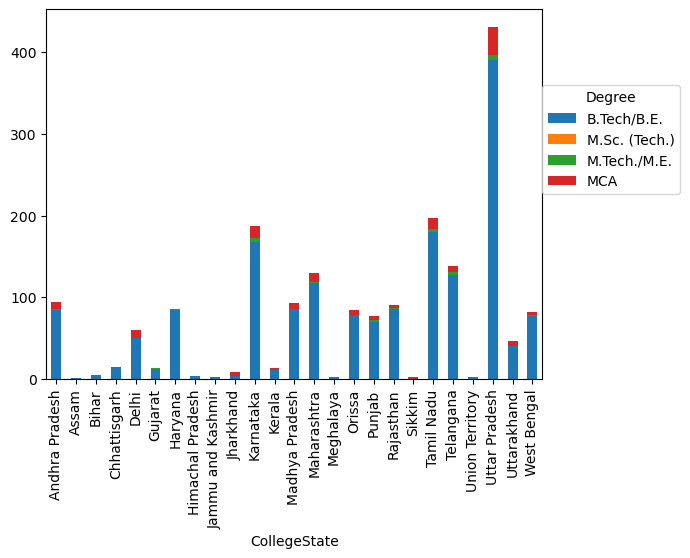

In [66]:
plt.figure(figsize=(20,15))
stacked_data.plot(kind='bar', stacked=True)
plt.legend(title='Degree',loc=(1,0.5))
plt.show()

The stacked bar graph comparing college state and degree indicates that individuals from Uttar Pradesh have the highest representation and predominantly hold B.Tech/B.E degrees within the dataset.

In [67]:
# Stacked bar plot for college state and salary bins
stacked_data=df.groupby(['CollegeState','Salary_bin']).size().unstack()

<Figure size 2000x1500 with 0 Axes>

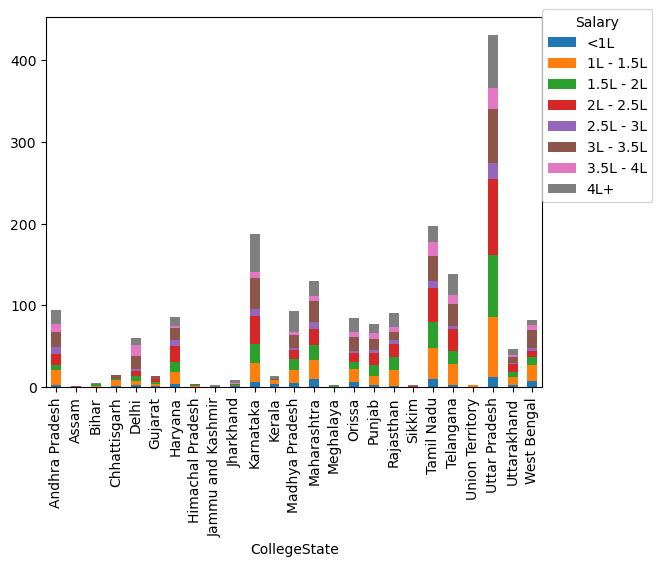

In [68]:
plt.figure(figsize=(20,15))
stacked_data.plot(kind='bar', stacked=True)
plt.legend(title='Salary',loc=(1,0.5))
plt.show()

The stacked bar graph comparing college state and salary bins reveals that individuals from Uttar Pradesh have the highest representation within the dataset, and the majority of them earn salaries in the 4+ Lakh range.

In [69]:
# Stacked bar plot for degree and salary bins
stacked_data=df.groupby(['Degree','Salary_bin']).size().unstack()

<Figure size 2000x1500 with 0 Axes>

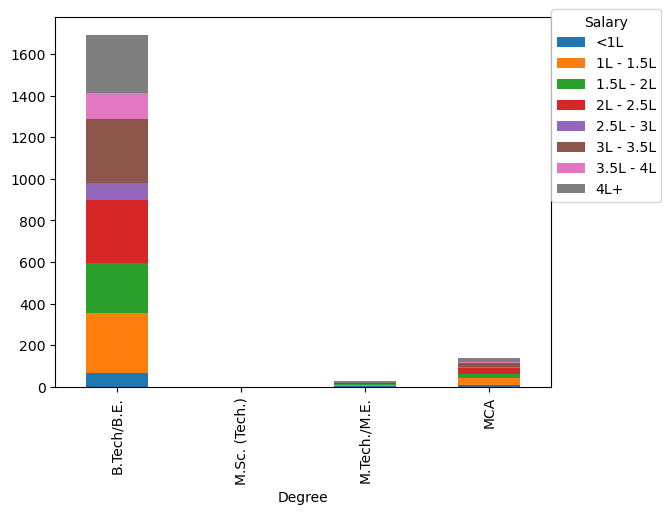

In [70]:
plt.figure(figsize=(20,15))
stacked_data.plot(kind='bar', stacked=True)
plt.legend(title='Salary',loc=(1,0.5))
plt.show()

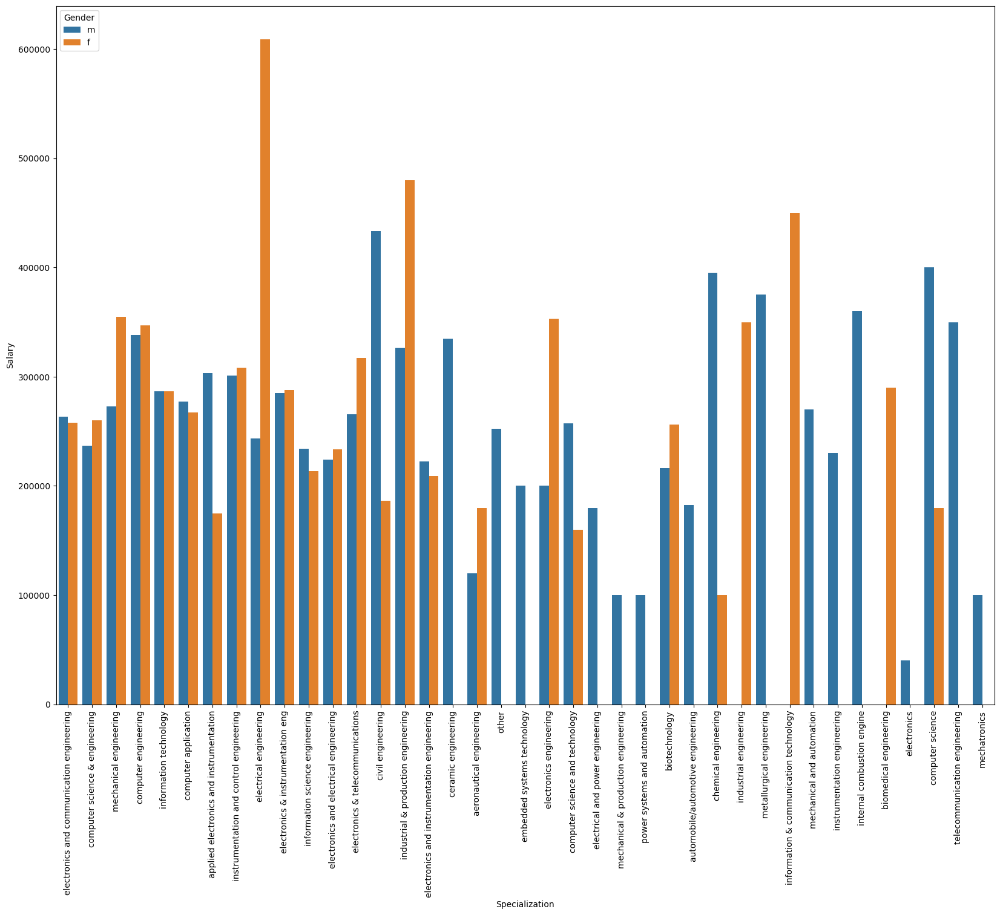

In [71]:
# Bar plot for specialization and salary with gender as hue
plt.figure(figsize=(20,15))
sns.barplot(x='Specialization', y='Salary',hue='Gender',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The bar graph comparing specialization and salary suggests that individuals specializing in Electrical Engineering tend to have the highest salaries. Additionally, it indicates that females are predominant in this specialization. However, it also highlights that in specializations such as Electronics, Mechatronics, and Others, there are no female individuals represented in the dataset.

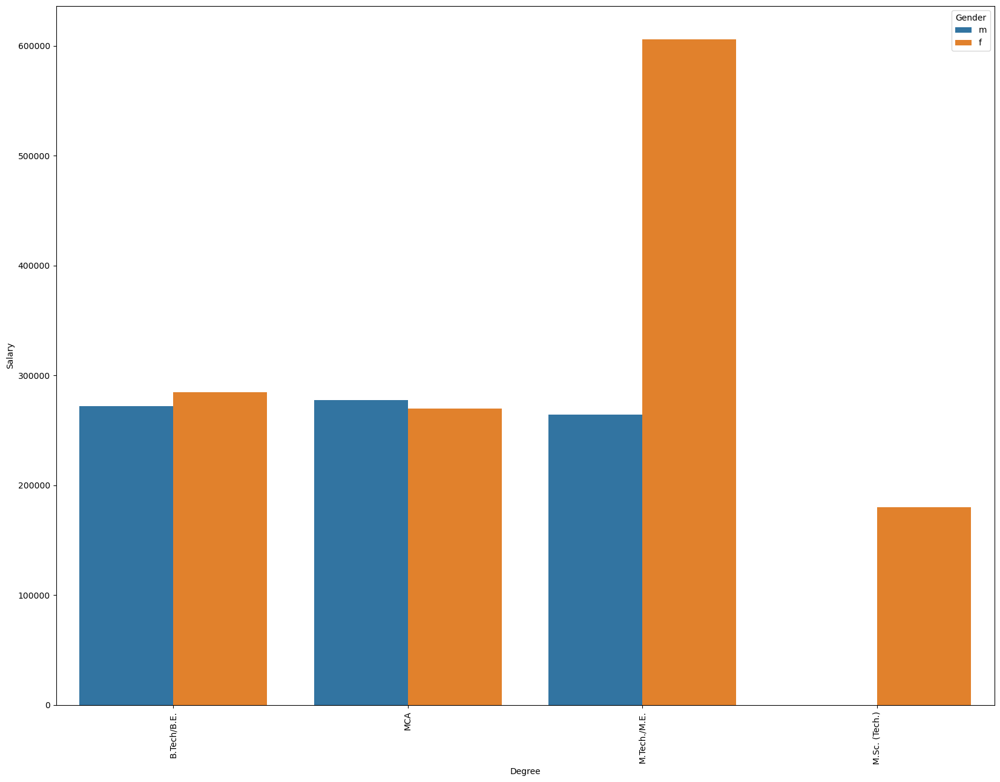

In [72]:
# Bar plot for degree and salary with gender as hue
plt.figure(figsize=(20,15))
sns.barplot(x='Degree', y='Salary',hue='Gender',data=df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The above bar plot indicates that the majority of females are represented in the M.Tech/M.E degree category, while the M.Sc.(Tech) degree category does not have any male individuals represented within the dataset.

In [73]:
# Bar plot for top 20 designations and salary with gender as hue
desi.sort_values(by='Salary',ascending=False).head(20).index

Index(['software engineer', 'system engineer', 'software developer',
       'programmer analyst', 'systems engineer', 'senior software engineer',
       'java software engineer', 'project engineer',
       'technical support engineer', 'software test engineer',
       'assistant manager', 'senior systems engineer', 'application developer',
       'java developer', 'test engineer', 'network engineer',
       'automation engineer', 'web developer', 'business analyst',
       'associate software engineer'],
      dtype='object', name='Designation')

In [74]:
desired_designations = ['software engineer', 'software developer', 'system engineer',
                        'systems engineer', 'programmer analyst', 'senior software engineer',
                        'java software engineer', 'project engineer', 'technical support engineer',
                        'software test engineer', 'application developer', 'assistant manager',
                        'senior systems engineer', 'java developer', 'test engineer', 'network engineer',
                        'automation engineer', 'associate software engineer', 'programmer', 'web developer']

filtered_df = df[df['Designation'].isin(desired_designations)]


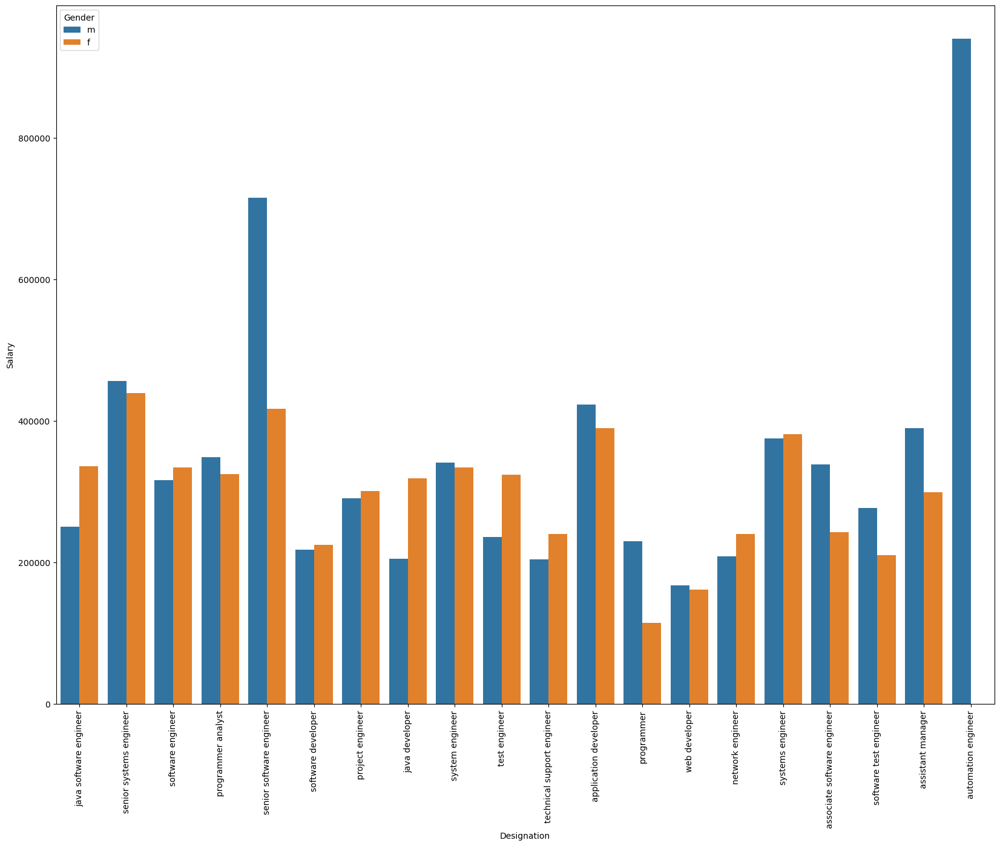

In [75]:
# Bar plot for top 20 designations and salary with gender as hue
plt.figure(figsize=(20,15))
sns.barplot(x='Designation', y='Salary',hue='Gender',data=filtered_df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The bar plot comparing the top 20 designations and salary suggests that Automation Engineer has the highest salary among males, but does not have any females represented.

In [76]:
# Bar plot for top 20 job cities and salary with gender as hue
city.sort_values(by='Salary',ascending=False).head(20).index

Index(['Bangalore', 'Noida', 'Hyderabad', 'Pune', 'Chennai', 'New Delhi',
       'Gurgaon', 'Mumbai', 'Kolkata', 'Jaipur', 'Mysore', 'gurgaon',
       'Navi Mumbai', 'Bhopal', 'chennai', 'Lucknow', 'bangalore',
       'Bhubaneswar', 'Ahmedabad', 'Chandigarh'],
      dtype='object', name='JobCity')

In [93]:
desired_designations = ['Bangalore', 'Noida', 'Hyderabad', 'Pune', 'Chennai', 'New Delhi',
       'Gurgaon', 'Mumbai', 'Kolkata', 'Jaipur', 'Mysore', 'gurgaon',
       'Navi Mumbai', 'Bhopal', 'chennai', 'Lucknow', 'bangalore',
       'Bhubaneswar', 'Ahmedabad']
filtered_df = df[df['JobCity'].isin(desired_designations)]


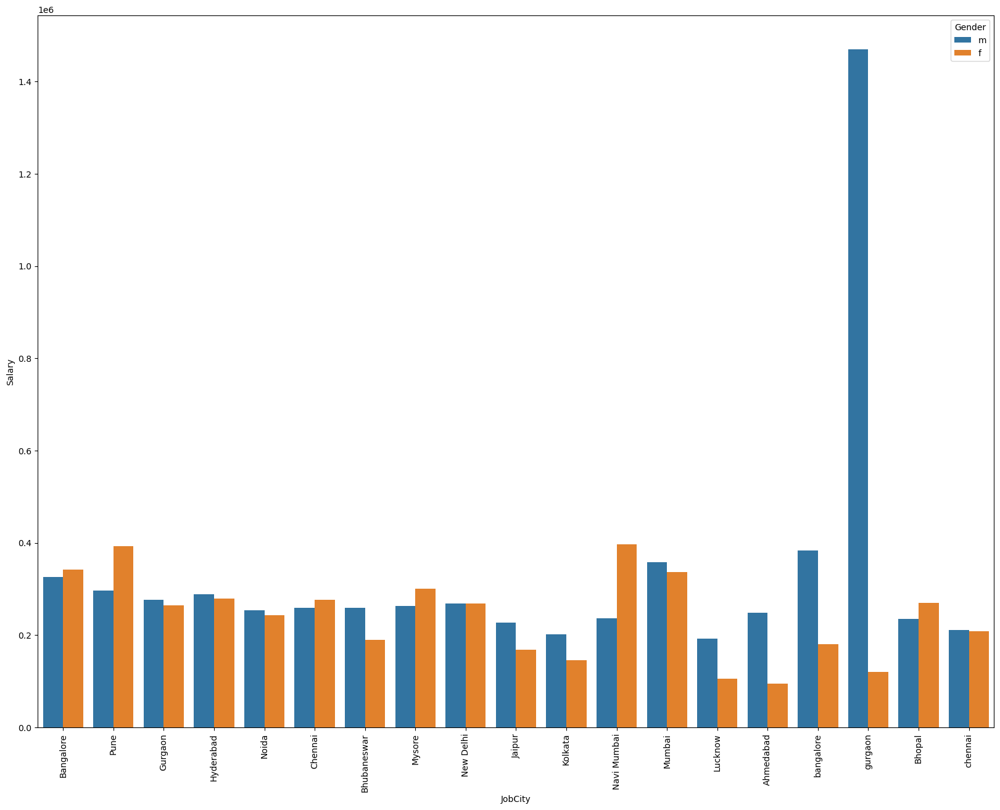

In [94]:
# Bar plot for top 20 job cities and salary with gender as hue
plt.figure(figsize=(20,15))
sns.barplot(x='JobCity', y='Salary',hue='Gender',data=filtered_df, estimator=np.mean,errorbar=None) 
plt.xticks(rotation=90)
plt.show()

The above bar plot illustrating the relationship between job city and salary suggests that Gurugram has the highest salary, with males having the highest salary among genders within this city.

In [79]:
# Stacked bar plot for specialization and gender
stacked_data=df.groupby(['Specialization','Gender']).size().unstack()

<Figure size 2000x1500 with 0 Axes>

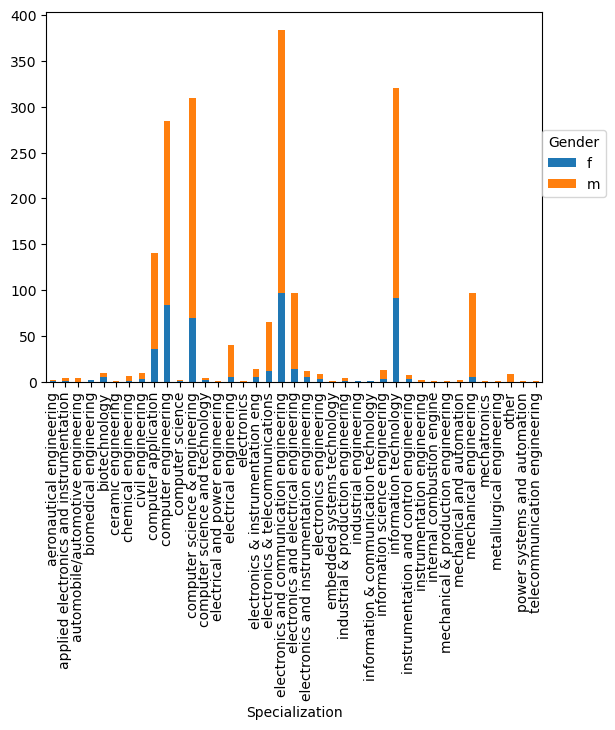

In [80]:
plt.figure(figsize=(20,15))
stacked_data.plot(kind='bar', stacked=True)
plt.legend(title='Gender',loc=(1,0.5))
plt.show()

The stacked bar graph comparing specialization and gender indicates that Electronics and Communication Engineering has the highest representation of females within the dataset.

In [81]:
# Chi-square test for independence between gender and specialization

from scipy.stats import chi2_contingency
# Create a contingency table of gender and specialization
contingency_table = pd.crosstab(df['Gender'], df['Specialization'])

# Print the contingency table
print(contingency_table)

# Perform the chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)
print('Chi-square test statistic:', chi2)
print('p-value:', p)


Specialization  aeronautical engineering  \
Gender                                     
f                                      1   
m                                      1   

Specialization  applied electronics and instrumentation  \
Gender                                                    
f                                                     1   
m                                                     3   

Specialization  automobile/automotive engineering  biomedical engineering  \
Gender                                                                      
f                                               0                       2   
m                                               4                       0   

Specialization  biotechnology  ceramic engineering  chemical engineering  \
Gender                                                                     
f                           5                    0                     1   
m                           4                    

Since the p-value is less than the significance level of 0.05, we reject the null hypothesis, concluding that there is a statistically significant relationship between gender and specialization. In other words, the preference of specialization does depend on gender.

In [82]:
# Check average salary for specified job titles
fil_data = df[(df['Specialization'] == 'computer science & engineering') & 
                   (df['Designation'].isin(['programmer analyst', 'software engineer', 'hardware engineer', 'associate engineer']))]

In [83]:
average_salary = fil_data['Salary'].mean()
average_salary

303965.5172413793

In [84]:
# Check if the average salary falls within the claimed range
if 250000 <= average_salary <= 300000:
    print("The average salary for the specified job titles falls within the claimed range.")
elif average_salary>300000:
    print("Earn greater than 3L")
else:
    print("The average salary for the specified job titles does not fall within the claimed range.")

Earn greater than 3L


In [85]:
# Filter the data for fresh graduates in Computer Science Engineering with the specified job titles
filtered_data = df[(df['Specialization'] == 'computer science & engineering') & 
                   (df['Designation'].isin(['programmer analyst', 'software engineer', 'hardware engineer', 'associate engineer'])) & 
                   ((df['DOJ'].dt.year == df['GraduationYear']) | (df['DOJ'].dt.year == df['GraduationYear'] + 1))]

# Calculate the average salary for these job titles
average_salary = filtered_data['Salary'].mean()

# Check if the average salary falls within the claimed range
if 250000 <= average_salary <= 300000:
    print("The average salary for the specified job titles falls within the claimed range.")
else:
    print("The average salary for the specified job titles does not fall within the claimed range.")


The average salary for the specified job titles does not fall within the claimed range.


In [86]:
average_salary

302500.0

In [87]:
# Filter the data for fresh graduates in Computer Science Engineering with the specified job titles
filtered_data = df[(df['Specialization'] == 'computer science & engineering') & 
                   (df['Designation'].isin(['programmer analyst', 'software engineer', 'hardware engineer', 'associate engineer'])) & 
                   ((df['DOJ'].dt.year == df['GraduationYear']))]

# Calculate the average salary for these job titles
average_salary = filtered_data['Salary'].mean()

# Check if the average salary falls within the claimed range
if 250000 <= average_salary <= 300000:
    print("The average salary for the specified job titles falls within the claimed range.")
else:
    print("The average salary for the specified job titles does not fall within the claimed range.")


The average salary for the specified job titles does not fall within the claimed range.


In [88]:
average_salary

311875.0

# Conclusion

## Exploratory Data Analysis (EDA) Summary

### Data Cleaning
- The dataset was cleaned by handling missing values, dropping duplicates, and converting columns to appropriate data types.
- Outliers were identified and handled appropriately.

### Univariate Analysis
- Boxplot analysis revealed outliers in various numerical columns, highlighting potential variations in salary and academic performance.
- Histograms and KDE plots provided insights into the distribution patterns of numerical variables, indicating skewness and potential normality.
- Count plots depicted the frequency of categorical variables, revealing trends in educational backgrounds and geographic distributions.

### Bivariate Analysis
- Heatmap analysis showed correlations between numerical variables, indicating potential relationships between academic performance, technical skills, personality traits, and salary levels.
- Pair plots and scatter plots illustrated relationships between numerical variables and salary, highlighting the impact of academic performance and technical skills on earnings.
- Bar plots showcased relationships between categorical variables and salary, providing insights into salary disparities based on educational backgrounds, specializations, job cities, and gender.

## Key Findings
- Academic performance and technical skills, such as English scores, Computer Programming scores, and 12th percentage, demonstrated significant correlations with salary levels.
- Individuals with higher academic performance and technical skills tended to command higher salaries.
- Specializations in fields like Information and Communication Technology and Electrical Engineering were associated with higher salaries.
- Job cities like Bangalore and Noida had higher salary levels compared to others.
- Gender disparities were observed, with females tending to earn higher salaries on average.
- Significant variations in salary were observed based on degree, specialization, and job designation.

## Insights and Recommendations
- The analysis highlights the importance of academic performance, technical skills, and specialization in determining salary levels.
- Employers can use these insights to tailor compensation packages based on skill sets and qualifications.
- Educational institutions can leverage these findings to adapt curriculum and training programs to meet industry demands and enhance students' employability.
- Further research and analysis could explore additional factors influencing salary levels, such as industry sectors, job roles, and years of experience.

Overall, the EDA provides valuable insights into the dataset's characteristics and relationships between variables, offering actionable insights for stakeholders in recruitment, education, and human resources management.
